<img src="e-commerce_art_new.jpg" alt="E-commerce Art" style="width:900px;height:500px;">

<h1 style= 'font-family:Sabon; font-size:36.0pt;text-align:center;'>E Commerce Project - Product Range Analysis</h1>


<span style='font-family:Sabon;font-size:24.0pt;'>
    <b>Table of Contents</b>
</span>
<span style='font-family:Sabon;font-size:16.0pt;line-height:1.5'>
    <ul>        
        <li><a href='#intro'>1. Introduction</a></li>
        <li><a href='#libraries'>2. Import Libraries</a></li>
        <li><a href='#func'>3. Define Functions</a></li>
        <li><a href='#import_data'>4. Import Data</a></li>
        <li><a href='#gen_info'>5. General Information</a></li>        
        <ul>
            <li><a href='#gen_overview'>5.1 Dataset Overview</a></li>
            <li><a href='#gen_stats'>5.2 Preliminary Statistics</a></li>
            <li><a href='#gen_conc'>5.3 Conclusion</a></li>
        </ul>
        <li><a href='#preprocessing'>6. Preparing Data for Analysis</a></li>
        <ul>
            <li><a href='#pp_col'>6.1 Column Name Transformation</a></li>
            <li><a href='#pp_strip'>6.2 Strip Spaces from Descriptions</a></li>
            <li><a href='#pp_date'>6.3 Adding Date Column</a></li>
            <li><a href='#pp_mis'>6.4 Checking for Missing Values</a></li>
            <li><a href='#pp_dup'>6.5 Checking for Duplicated Rows</a></li>
            <li><a href='#pp_dt'>6.6 Invoice_id Datatype Investigation</a></li>
            <li><a href='#pp_split'>6.7 Split data into Returns and Purchases</a></li>
            <li><a href='#pp_sum0'>6.8 Checking for Invoices With Sum 0</a></li>
            <li><a href='#pp_outliers'>6.9 Processing Quantity Outliers</a></li>
            <li><a href='#pp_conc'>6.10 Conclusion</a></li>
        </ul>
        <li><a href='#EDA'>7. Exploratory and Seasonal Analysis</a></li>
        <ul>
            <li><a href='#EDA_overview'>7.1 Data Overview</a></li>
            <li><a href='#EDA_seasonal'>7.2 Analyzing Seasonality</a></li>
            <li><a href='#EDA_top10'>7.3 Top 10 Products with Strong Seasonality Highlight</a></li>
            <li><a href='#EDA_vs'>7.4 Profitability of Seasonal Products vs Non-Seasonal Products</a></li>  
            <li><a href='#EDA_conc'>7.5 Conclusion</a></li>
        </ul>
        <li><a href='#MBA'>8. Market Basket Analysis</a></li>
            <ul>
                <li><a href='#MBA_itemset'>8.1 Creating Itemsets</a></li>
                <li><a href='#MBA_bundles'>8.2 Top 5 Bundles</a></li>
                <li><a href='#MBA_hunt'>8.3 Hunting for Unlikely Combinations</a></li>
                <li><a href='#MBA_conc'>8.4 Conclusion</a></li>
            </ul>    
        <li><a href='#FDA'>9. Analyzing First Transactions</a></li>
            <ul>
                <li><a href='#FDA_conc'>9.1 Conclusion</a></li>
            </ul>    
        <li><a href='#testing'>10. Hypothesis Testing</a></li>
            <ul>
                <li><a href='#testing_h1'>10.1 Does sale average change significantly during previously detected seasonal periods compared to normal periods?</a></li>
                <ul>
                    <li><a href='#testing_h1_sample'>10.1.1 Sample Creation</a></li>
                    <li><a href='#testing_h1_outliers1'>10.1.2 Processing Outliers</a></li>
                    <li><a href='#testing_h1_outliers2'>10.1.3 Processing Outliers</a></li>
                    <li><a href='#testing_h1_shapiro'>10.1.4 Testing for Normal Distribution</a></li>
                    <li><a href='#testing_h1_test'>10.1.5 Mann Whitney U Testing</a></li>
                </ul>
                <li><a href='#testing_h2'>10.2 Does cart item variety change significantly between the first transaction and other transactions in non-seasonal periods?</a></li>
                <ul>
                    <li><a href='#testing_h2_easter'>10.2.1 Removing Easter Items</a></li>
                    <li><a href='#testing_h2_sample'>10.2.2 Sample Creation</a></li>
                    <li><a href='#testing_h2_test'>10.2.3 Z Proportion Test</a></li>
                </ul>
                <li><a href='#testing_conc'>10.3 Conclusion</a></li>
            </ul>
        <li><a href='#final_conc'>11. Final Conclusion and Recommendations</a></li>
            <ul>
                <li><a href='#final_rec'>11.1 Recommendations</a></li>
            </ul>
        <li><a href='#presentation'>12. Presentation Link</a></li>
        <li><a href='#references'>13. References</a></li>
        </ul>
</span>

<a id="intro"></a>
<h2>Introduction</h2>

<span style='font-family:Sabon;font-size:14.0pt;'>
    <p>
    In this project we take the part of a data analyst working for an E-commerce retailer.<br>
    Our job is to provide a detailed product range analysis.<br><br>
        We have prepared numerous steps in our analysis, which includes seasonal analysis, market basket analysis, and first transaction profile analysis.<br>
        With these subjects covered, the company can have a better idea of the potential of their products, improve timeliness of inventory acquisition. develop recommendation systems, increase customer engagement, increase customer acquisition and ultimately increase ROI.<br><br>
        In order to achieve our goal we will employ various data analysis methods such as machine learning and statistical hypothesis testing.
    </p>
</span>


<a id="libraries"></a>
<h2>Import Libraries</h2>

In [5]:
#update plotly as some older versions do not show pie charts
!pip -q install plotly --upgrade

In [6]:
!pip -q install sidetable

In [7]:
!pip -q install mlxtend

In [8]:
import warnings
import pandas as pd
import numpy as np
import sidetable as stb
import plotly.graph_objects as go
import plotly.express as px
import math
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats as st
import random
from mlxtend.frequent_patterns import apriori, association_rules

In [9]:
warnings.filterwarnings('ignore')

<a id="func"></a>
<h2>Define Functions</h2>

In [10]:
def val_counts(df_list, drop_na= True, n=5):
    
    """
    This function returns a dataframe's 
    column values and their value counts
    in absolute and relative values

    Parameters:
        df_list(list): a list of one or more dataframes.
                       Columns should be specified for
                       the columns which value counts you need.
        n (int): number of rows to report for each column. (Default = 5)
    Returns:
        A report of the first highest n value counts(absolute and relative) in each specified column
        for each df in the df_list.

    """
    for df in df_list:
        try:
            df_name = df.custom_name
        except:
            df_name = 'Dataframe {}'.format(df_list.index(df))
        print('Top {} Value Counts for {} :\n'.format(n,df_name))
        for column in df.columns:
            print('\nColumn: {}'.format(column))
            val_normalized = df[column].value_counts(normalize=True, dropna= drop_na).to_frame()
            val_absolute = df[column].value_counts(dropna= drop_na).to_frame()
            val_final = val_absolute.merge(val_normalized, right_index=True, left_index=True)
            val_final.columns = ['{}'.format(column+' '+'absolute'),'{}'.format(column+' '+'relative')]
            display(val_final.head(n))
            
def sample_display(df_list,n=5):
    """
    This function displays samples
    of all the dataframes in the list.
    n rows default 5
        
    Parameters:
    
        df_list: list of pandas dataframes
    
        n (int): number of sample rows to return
        
    Returns:
    
        n sample rows from each df listed
    
    """
    for df in df_list:
        print('{} sample:'.format(df.custom_name))
        display(df.sample(n))
        
def dup_display(df_list):
    """
    This function returns the
    number of duplicated rows
    in each df in the list
        
    Parameters:
        df_list: list of pandas dataframes
    
    Returns:
        report of duplicated rows in each df listed
        report of duplicates diversity in each df listed
    
    """
    alias= 0
    for df in df_list:
        dup_sum = df.duplicated().sum()
        dup_perc = dup_sum / df.shape[0]
        try:
            df_name = df.custom_name
        except:
            df_name = 'Unknown Dataframe {}'.format(alias)
            alias += 1
        
        print('{} :\nDuplicated Values: {}\n% duplicated rows: {:.2%}\n'.format(
            df_name,dup_sum,dup_perc
        )
             )
        print('Duplicates distribution diversity:')
        for col in df[df.duplicated()].columns:
            print('{} : {}'.format(
                col,df[df.duplicated()][col].nunique()
        )
             )
        print()
    
def binary_encode(x):
    """
    This simple function produces 0
    for x<=0 and 1 for x>0
    """
    if x <= 0:
        return 0
    else:
        return 1
    
def percentile_report(series, percentile=[1, 5, 95, 99]):
    """
    Prints a report of the percentiles defined in
    the percentile argument for a given series.
    
    Parameters:
        series(pd.Series): a pandas array
        percentile(list): a list of percentiles to report upon
    Returns:
        A report of values by percentiles.
    """
    print(series.name, 'Percentile Report:\n\n')
    print('Minimum value: {}'.format(series.min()))
    for perc in percentile:
        print('{} Percentile: {}'.format(perc, np.percentile(series, perc)))
        print('___________________________________')
        print('\n')
    print('Maximum value: {}'.format(series.max()))
    
def shapiro_result(array,alpha=0.05):
    """
    
    This function performs the shapiro
    test on an array, to test whether 
    the distribution is normal or not
    and produces a q-q plot for the array
    
    Parameters:
        array: sample to be tested
        alpha(float): Statistical significance level (default 0.05)
        
    Returns:
        The result of the test and a q-q plot based on the sample
    
    """
    if np.isnan(array).any():
        return('Eliminate null values before running this function')
    test= st.shapiro(array)
    #results
    if test[1] <= alpha:
        print(
            'pvalue is {}\nWe reject the null hypothesis\nNo significant evidence for normal distribution'\
            .format(test[1])
             )
    else:
        print(
            'pvalue is {}\nWe cannot reject the null hypothesis\nThere is significant evidence for normal distribution'\
            .format(test[1])
        )
    st.probplot(array, dist="norm", plot=plt)
    plt.show()
    
def levene_result(array_x, array_y, alpha=0.05):
    """
    
    This function performs the levene
    test on two arrays, to test whether 
    their variance is similar or not.
    The default alpha value is 0.05
    
    parameters:
        array_x, array_y : samples to be tested
        alpha(int): statistical significance level (default= 0.05)
    
    """
    if np.isnan(array_x).any() or np.isnan(array_y).any():
        return('Eliminate null values before running this function')
    test= st.levene(array_x,array_y)
    #results
    if test[1] <= alpha:
        print(
            'pvalue is {}\nWe reject the null hypothesis\nNo significant evidence for equal variance'\
            .format(test[1])
        )
    else:
        print(
            'pvalue is {}\nWe cannot reject the null hypothesis\nThere is significant evidence for equal variance'\
            .format(test[1])
        )
        
def mann_whitney_result(sample_a,sample_b,alpha=0.05):
    """
    
    This function performs the Mann-Whitney U
    test on two given samples to test whether 
    they belong to the same statistical population or not.
    
    Parameters:
        sample_a: first sample to be tested
        sample_b: second sample to be tested
        alpha(float): Statistical significance level (default 0.05)
        
    Returns:
        The result of the hypothesis test, the alpha value used and the pvalue
    
    """
    test= st.mannwhitneyu(sample_a, sample_b)
    sample_a_avg = round(sample_a.mean(),2)
    sample_b_avg = round(sample_b.mean(),2)
    #results
    if test[1] <= alpha:
        print(
            'Significance Level: {}\npvalue is {:.4f}\nWe reject the null hypothesis\nNo significant evidence that the two statistical populations are the same'\
            .format(alpha,test[1])
             )
        reject_h0 = 1
    else:
        print(
            'Significance Level: {}\npvalue is {:.4f}\nWe cannot reject the null hypothesis\nThere is no significant evidence that the populations are not the same'\
            .format(alpha,test[1])
        )
        reject_h0 = 0
    #produce report
    result_col = ['sample_1','sample_1_avg', 'sample_2','sample_2_avg', 'alpha', 'p_value', 'reject_h0']
    result_row = [sample_a.name, sample_a_avg,sample_b.name,sample_b_avg, alpha, round(test[1],3), reject_h0]
    display(pd.DataFrame(data=np.array([result_row]),columns= result_col))
        
def s_test(sample_a, sample_b, item, alpha=0.05):
    """
    
    This function performs a proportion z test on two
    groups and produces the p-value.
    
    Parameters:
    
        df: dataframe where the data of the groups is held
        group1(str): first group
        group2(str): second group
        item(str): item / event name
        alpha(float): statistical significance level (Default = 0.05)
        
    Returns:
        The result of the hypothesis test, the event name, alpha value used and the pvalue.
    
    """    
    group1 = sample_a['group'].unique()[0]
    group2 = sample_b['group'].unique()[0]
    
    successes_g1 = sample_a[sample_a.index == item]['count'][0]
    successes_g2 = sample_b[sample_b.index == item]['count'][0]
    
    trials_g1 = sample_a['count'].sum()
    trials_g2 = sample_b['count'].sum()
    
    p1 = successes_g1 / trials_g1
    p2 = successes_g2 / trials_g2

    p_combined = (successes_g1 + successes_g2) / (trials_g1 + trials_g2)   
    diff = p1 - p2
    z_value = diff / math.sqrt(p_combined * (1 - p_combined) * (1/trials_g1 + 1/trials_g2))
    distr = st.norm(0, 1)
    p_value = (1 - distr.cdf(abs(z_value))) * 2
    
    print('Tested groups: {} , {}\nTested event: {}\nStatistical significance: {}\nPvalue: {}'.format(group1, group2, item, alpha, p_value))
    print()
    print('Group {} successes: {}, Trials: {}, ratio: {:.3f}'.format(group1, successes_g1, trials_g1, p1))
    print()
    print('Group {} successes: {}, Trials: {}, ratio: {:.3f}'.format(group2, successes_g2, trials_g2, p2))
    print()
    if (p_value < alpha):
        reject_h0 = 1
        print("Reject the null hypothesis: there is evidence that the difference between the proportions is significant")
    else:
        reject_h0 = 0
        print("Cannot reject the null hypothesis: there is no evidence that the difference between the proportions is significant")
    result_col = ['sample_1', 'sample_2', 'item_name', 'alpha', 'p_value', 'reject_h0']
    result_row = [group1, group2, item, alpha, round(p_value,3), reject_h0]
    display(pd.DataFrame(data=np.array([result_row]),columns= result_col))
    print('_____________________________________________\n')

<a id="import_data"></a>
<h2>Import Data</h2>

In [11]:
#import from local directory
ec_raw = pd.read_csv(
    'ecommerce_dataset_us.csv',
    sep= '\t',
    parse_dates = ['InvoiceDate']
)

#define df name for reference
ec_raw.custom_name = 'ec_raw'

<a id="gen_info"></a>
<h2>General Information</h2>

<a id="gen_overview"></a>
<h3>Dataset Overview</h3>

In [12]:
#general info
ec_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 7 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    541909 non-null  object        
 1   StockCode    541909 non-null  object        
 2   Description  540455 non-null  object        
 3   Quantity     541909 non-null  int64         
 4   InvoiceDate  541909 non-null  datetime64[ns]
 5   UnitPrice    541909 non-null  float64       
 6   CustomerID   406829 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 28.9+ MB


In [13]:
#show sample of the data
ec_raw.sample(5)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID
140017,548373,21878,PACK OF 6 SANDCASTLE FLAGS ASSORTED,1,2019-03-28 16:34:00,1.63,NaN
514967,579754,22367,CHILDRENS APRON SPACEBOY DESIGN,1,2019-11-28 14:52:00,1.95,17911.0
157971,550216,22084,PAPER CHAIN KIT EMPIRE,12,2019-04-13 11:06:00,2.95,13516.0
534318,581146,23349,ROLL WRAP VINTAGE CHRISTMAS,3,2019-12-05 13:53:00,1.25,17602.0
452261,575331,85099B,JUMBO BAG RED RETROSPOT,10,2019-11-07 13:52:00,2.08,13209.0


In [14]:
#produce report of top 5 value counts for each column
val_counts([ec_raw])

Top 5 Value Counts for ec_raw :


Column: InvoiceNo


,InvoiceNo absolute,InvoiceNo relative
573585,1114,0.002056
581219,749,0.001382
581492,731,0.001349
580729,721,0.001330
558475,705,0.001301



Column: StockCode


,StockCode absolute,StockCode relative
85123A,2313,0.004268
22423,2203,0.004065
85099B,2159,0.003984
47566,1727,0.003187
20725,1639,0.003024



Column: Description


,Description absolute,Description relative
WHITE HANGING HEART T-LIGHT HOLDER,2369,0.004383
REGENCY CAKESTAND 3 TIER,2200,0.004071
JUMBO BAG RED RETROSPOT,2159,0.003995
PARTY BUNTING,1727,0.003195
LUNCH BAG RED RETROSPOT,1638,0.003031



Column: Quantity


,Quantity absolute,Quantity relative
1,148227,0.273527
2,81829,0.151001
12,61063,0.112681
6,40868,0.075415
4,38484,0.071016



Column: InvoiceDate


,InvoiceDate absolute,InvoiceDate relative
2019-10-29 14:41:00,1114,0.002056
2019-12-06 09:28:00,749,0.001382
2019-12-07 10:03:00,731,0.001349
2019-12-03 17:24:00,721,0.001330
2019-06-27 15:58:00,705,0.001301



Column: UnitPrice


,UnitPrice absolute,UnitPrice relative
1.25,50496,0.093182
1.65,38181,0.070456
0.85,28497,0.052586
2.95,27768,0.051241
0.42,24533,0.045271



Column: CustomerID


,CustomerID absolute,CustomerID relative
17841.0,7983,0.019622
14911.0,5903,0.014510
14096.0,5128,0.012605
12748.0,4642,0.011410
14606.0,2782,0.006838


<a id='gen_stats'></a>
<h3>Preliminary Statistics</h3>

In [15]:
#display preliminary statistics
display(
    ec_raw.describe().T,
    ec_raw.describe(include='datetime'),
    ec_raw.describe(include='object').T
       )

,count,mean,std,min,25%,50%,75%,max
Quantity,541909.0,9.552250,218.081158,-80995.00,1.00,3.00,10.00,80995.0
UnitPrice,541909.0,4.611114,96.759853,-11062.06,1.25,2.08,4.13,38970.0
CustomerID,406829.0,15287.690570,1713.600303,12346.00,13953.00,15152.00,16791.00,18287.0


,InvoiceDate
count,541909
unique,23260
top,2019-10-29 14:41:00
freq,1114
first,2018-11-29 08:26:00
last,2019-12-07 12:50:00


,count,unique,top,freq
InvoiceNo,541909,25900,573585,1114
StockCode,541909,4070,85123A,2313
Description,540455,4223,WHITE HANGING HEART T-LIGHT HOLDER,2369


<a id="gen_conc"></a>
<h3>Conclusion</h3>

<span style='font-family:sabon;font-size:13pt;'>
   From checking the general info and statistics of the data we find:<br><br>
   <ul>
      <li>The table contains <b>541,909</b> rows, each containing invoices from user purchases, including the date of purchase, item information, quantities and price.</li>
      <li>The data encompasses the period of 2018-11-29 to 2019-12-07.</li>
      <li>Some of the biggest orders include over 700 items.</li>
      <li>There are 25,900 invoices in the data.</li>
      <li>There are 4,070 unique product codes in the data. Of which 4,223 have descriptions.</li>
      <li>The average quantity per item in an invoice is 9.6 while the median is 3. There seem to be edge minimum and maximum values driving the average askew.</li>
      <li>Unit price average is 4.6 with median of 2.1, with edge cases driving the average askew.</li>
      <li>Customer id and description column seem to contain missing values.</li>
   </ul>
</span>

<a id="preprocessing"></a>
<h2>Preparing Data for Analysis</h2>

<a id='pp_col'></a>
<h3>Column Name Transformation</h3>

In [16]:
#define new column names
cols = ['invoice_id', 'item_id', 'description', 'quantity', 'invoice_ts', 'unit_price', 'customer_id']

#apply new column names
ec_raw.columns = cols

<a id='pp_strip'></a>
<h3>Strip Spaces from Descriptions</h3>

In [17]:
#strip spaces from beginning and end of descriptions
ec_raw['description'] = ec_raw['description'].str.strip()

<a id='pp_date'></a>
<h3>Adding a Date and Month Column</h3>

In [18]:
#add invoice_date column
ec_raw['invoice_date'] = ec_raw['invoice_ts'].dt.date
ec_raw['invoice_date'] = ec_raw['invoice_date'].astype('datetime64')

ec_raw['invoice_month'] = ec_raw['invoice_date'].dt.month

ec_raw.sample()

,invoice_id,item_id,description,quantity,invoice_ts,unit_price,customer_id,invoice_date,invoice_month
332869,566124,22961,JAM MAKING SET PRINTED,6,2019-09-07 11:15:00,1.45,16515.0,2019-09-07,9


<a id="pp_mis"></a>
<h3>Checking for Missing Values</h3>

In [19]:
ec_raw.stb.missing(style=True)

,missing,total,percent
customer_id,"135,080","541,909",24.93%
description,"1,454","541,909",0.27%
invoice_id,0,"541,909",0.00%
item_id,0,"541,909",0.00%
quantity,0,"541,909",0.00%
invoice_ts,0,"541,909",0.00%
unit_price,0,"541,909",0.00%
invoice_date,0,"541,909",0.00%
invoice_month,0,"541,909",0.00%


<h4>Investigation of Description Missing Values</h4>

In [20]:
#show sample of rows where description is missing
na_desc = ec_raw[(ec_raw['description'].isna())]
na_desc.sample(5)

,invoice_id,item_id,description,quantity,invoice_ts,unit_price,customer_id,invoice_date,invoice_month
228606,556933,22783,NaN,2,2019-06-13 15:42:00,0.0,NaN,2019-06-13,6
117315,546379,72225C,NaN,-82,2019-03-09 12:21:00,0.0,NaN,2019-03-09,3
38542,539585,21009,NaN,1,2018-12-18 12:54:00,0.0,NaN,2018-12-18,12
363134,568545,22548,NaN,-70,2019-09-25 14:34:00,0.0,NaN,2019-09-25,9
75252,542569,85028L,NaN,-1,2019-01-26 14:53:00,0.0,NaN,2019-01-26,1


In [21]:
#produce value counts for suspicious columns
val_counts([na_desc[['description', 'customer_id', 'unit_price']]])

Top 5 Value Counts for Dataframe 0 :


Column: description


,description absolute,description relative



Column: customer_id


,customer_id absolute,customer_id relative



Column: unit_price


,unit_price absolute,unit_price relative
0.0,1454,1.0


<span style='font-family:sabon;font-size:13pt'>
             <b>Results:</b><br><br>
For rows where description is null, all customer ids are null as well and unit price is always 0.
    </span>

In [22]:
#extract item ids that belong to items without description
na_item_ids = na_desc['item_id'].unique()

#show entries from the raw data using the item ids from the missing description entries
display(
    ec_raw[ec_raw['item_id'].isin(na_item_ids)].sample(5),
    ec_raw[['item_id']].stb.missing(style=True)
)

,invoice_id,item_id,description,quantity,invoice_ts,unit_price,customer_id,invoice_date,invoice_month
115840,546155,22087,PAPER BUNTING WHITE LACE,6,2019-03-08 08:29:00,2.95,15632.0,2019-03-08,3
83880,543355,22729,ALARM CLOCK BAKELIKE ORANGE,2,2019-02-05 13:50:00,3.75,16033.0,2019-02-05,2
499893,578701,22632,HAND WARMER RED RETROSPOT,12,2019-11-23 10:52:00,2.10,17624.0,2019-11-23,11
255646,559358,22847,BREAD BIN DINER STYLE IVORY,1,2019-07-05 19:14:00,16.95,15675.0,2019-07-05,7
420267,572884,82583,HOT BATHS METAL SIGN,12,2019-10-24 13:44:00,2.10,13924.0,2019-10-24,10


,missing,total,percent
item_id,0,"541,909",0.00%


<span style='font-family:sabon;font-size:13pt'>
<b>Results:</b><br><br>
We see that even though their description is missing, these 
items still exist throughout the data on other rows.<br>
Let's take a look at 
</span>

In [23]:
#produce a count of descriptions for each item id 
desc_count = ec_raw[['item_id','description']].groupby(['item_id'], as_index=False).nunique().sort_values('description', ascending=False)

#define data slice with item ids that have more than one description
multi_desc_expanded = ec_raw[ec_raw['item_id'].isin(desc_count.query('description >= 2')['item_id'])].drop_duplicates(subset = ['item_id','description']).sort_values('item_id')
multi_desc_expanded.head(10)

,invoice_id,item_id,description,quantity,invoice_ts,unit_price,customer_id,invoice_date,invoice_month
279310,561271,10080,NaN,170,2019-07-24 12:18:00,0.00,NaN,2019-07-24,7
454350,575518,10080,check,22,2019-11-08 10:53:00,0.00,NaN,2019-11-08,11
103332,545060,10080,GROOVY CACTUS INFLATABLE,2,2019-02-25 13:47:00,0.85,15547.0,2019-02-25,2
741,536446,10133,COLOURING PENCILS BROWN TUBE,5,2018-11-29 12:15:00,0.85,15983.0,2018-11-29,11
474647,576843,10133,damaged,-82,2019-11-14 15:32:00,0.00,NaN,2019-11-14,11
23437,538200,15058A,BLUE POLKADOT GARDEN PARASOL,1,2018-12-08 11:11:00,7.95,17912.0,2018-12-08,12
192289,553394,15058A,wet/rusty,-30,2019-05-14 16:47:00,0.00,NaN,2019-05-14,5
108588,545551,15058A,NaN,20,2019-03-01 15:11:00,0.00,NaN,2019-03-01,3
81425,543126,15058C,ICE CREAM DESIGN GARDEN PARASOL,4,2019-02-01 14:41:00,7.95,13581.0,2019-02-01,2
192290,553395,15058C,wet/rusty,-30,2019-05-14 16:47:00,0.00,NaN,2019-05-14,5


In [24]:
#for items with most descriptions per item_id show unique item_id+description coupling
ec_raw[ec_raw['item_id'].isin(desc_count['item_id'].head(10))].sort_values('item_id').drop_duplicates(subset = ['item_id','description']).head(10)

,invoice_id,item_id,description,quantity,invoice_ts,unit_price,customer_id,invoice_date,invoice_month
522,536409,20713,JUMBO BAG OWLS,1,2018-11-29 11:45:00,1.95,17908.0,2018-11-29,11
380688,569831,20713,wrongly coded-23343,-800,2019-10-04 12:38:00,0.00,NaN,2019-10-04,10
263884,560039,20713,wrongly marked. 23343 in box,-3100,2019-07-12 14:27:00,0.00,NaN,2019-07-12,7
136272,547957,20713,NaN,32,2019-03-26 15:16:00,0.00,NaN,2019-03-26,3
420390,572890,20713,Marked as 23343,400,2019-10-24 14:14:00,0.00,NaN,2019-10-24,10
422750,573114,20713,wrongly coded 23343,1000,2019-10-25 15:36:00,0.00,NaN,2019-10-25,10
415582,572547,20713,wrongly marked 23343,200,2019-10-22 17:01:00,0.00,NaN,2019-10-22,10
414145,572345,20713,Found,100,2019-10-22 10:53:00,0.00,NaN,2019-10-22,10
403534,571633,20713,found,100,2019-10-16 11:27:00,0.00,NaN,2019-10-16,10
537663,581334,21181,PLEASE ONE PERSON METAL SIGN,1,2019-12-06 12:07:00,2.10,17841.0,2019-12-06,12


<span style='font-family:sabon;font-size:13pt'>
<b>we can see several things:</b><br><br>
many of the item codes are not in fact unique as they correlate to multiple descriptions.<br>This is because some of the transactions seem to be internal ones used to balance inventory / correct errors  and return damaged goods.
we see that many of these transactions have no customer id which makes sense.<br>
First we will remove rows where the description is missing, as we have no way of knowing if the transaction is internal (and thus having a description that isn't the item description).<br> Furthermore, this decision is supported by the fact that all of the rows where description is missing, the unit price is 0, something that is commonplace in internal transactions.<br><br>
One of the things that is a trait of this dataset is that normal item descriptions seem to all be entered in upper case.<br>if this is indeed the case, we can easily get rid of the irrelevant internal transactions by removing rows where the description is not upper case.<br>
Once we filter the data in that way, we can proceed to investigate the description/item_id issue deeper.
</span>

In [25]:
#produce report of missing value % 
pct_desc_miss = ec_raw['description'].isna().sum() / ec_raw.shape[0]
print('% descriptions that are missing: {:.2%}'.format(pct_desc_miss))

% descriptions that are missing: 0.27%


In [26]:
#remove rows where description is missing
ec_mod = ec_raw[ec_raw['description'].notna()]

In [27]:
pct_upper = ec_mod['description'].str.isupper().sum() / ec_mod.shape[0]
print('% descriptions that are uppercase: {:.2%}'.format(pct_upper))

% descriptions that are uppercase: 99.43%


In [28]:
#remove rows where item description is not all upper case
ec_mod = ec_mod[ec_mod['description'].str.isupper()]
display(ec_mod.sample(2),ec_mod[['item_id','description']].nunique())

,invoice_id,item_id,description,quantity,invoice_ts,unit_price,customer_id,invoice_date,invoice_month
324169,565396,21669,BLUE STRIPE CERAMIC DRAWER KNOB,1,2019-08-31 16:39:00,3.29,NaN,2019-08-31,8
378327,569643,23203,JUMBO BAG VINTAGE DOILY,10,2019-10-03 12:31:00,2.08,15730.0,2019-10-03,10


item_id        3905
description    4007
dtype: int64

<span style='font-family:sabon;font-size:13pt'>
Our work is not done yet.<br>There seem to still be some items with multiple descriptions.<br>let's take a quick look.
</span>

In [29]:
#aggregate multiple descriptions of same id by their frequency 
ec_description_top = ec_mod.groupby(['item_id','description']).count().reset_index().sort_values(['item_id','description','invoice_id'])

#choose the highest frequently used descriptions
ec_description_top = ec_description_top[['item_id','description','invoice_id']].sort_values(['item_id','invoice_id'], ascending=False).groupby('item_id').first().reset_index()
ec_description_top.columns = ['item_id','common_description', 'frequency']
print('items: {}'.format(ec_description_top.shape[0]))
display(ec_description_top.head())

items: 3905


,item_id,common_description,frequency
0,10002,INFLATABLE POLITICAL GLOBE,71
1,10080,GROOVY CACTUS INFLATABLE,22
2,10120,DOGGY RUBBER,30
3,10123C,HEARTS WRAPPING TAPE,3
4,10124A,SPOTS ON RED BOOKCOVER TAPE,5


In [30]:
#collect all item ids where an item id has more than one description in the data
item_ids = ec_mod.groupby('item_id', as_index=False).agg({'description' : 'nunique'}).sort_values('description', ascending=False).query('description > 1')

#merge to find the new description for each item id
item_update_description = item_ids.merge(ec_description_top, on='item_id')

In [31]:
#produce the different descriptions of the top 5 item ids with most descriptions
for index, row in item_update_description.head().iterrows():
    item= row['item_id']
    print('Descriptions available:')
    display(ec_mod.query('item_id == @item')['description'].unique())
    print('chosen title: {}'.format(row['common_description']))
    print()

Descriptions available:


array(['RETRO LEAVES MAGNETIC NOTEPAD',
       'RETO LEAVES MAGNETIC SHOPPING LIST',
       'LEAVES MAGNETIC  SHOPPING LIST', 'VINTAGE LEAF MAGNETIC NOTEPAD'],
      dtype=object)

chosen title: VINTAGE LEAF MAGNETIC NOTEPAD

Descriptions available:


array(['DOILEY STORAGE TIN', 'DOILEY BISCUIT TIN',
       'STORAGE TIN VINTAGE DOILEY', 'STORAGE TIN VINTAGE DOILY'],
      dtype=object)

chosen title: STORAGE TIN VINTAGE DOILY

Descriptions available:


array(['SET 36 COLOUR PENCILS DOILEY', 'SET 36 COLOURING PENCILS DOILY',
       'SET 36 COLOURING PENCILS DOILEY'], dtype=object)

chosen title: SET 36 COLOURING PENCILS DOILY

Descriptions available:


array(['BAKING MOULD CHOCOLATE CUPCAKES',
       'BAKING MOULD CHOCOLATE CUP CAKES',
       'BAKING MOULD CUPCAKE CHOCOLATE'], dtype=object)

chosen title: BAKING MOULD CHOCOLATE CUPCAKES

Descriptions available:


array(['LUNCH BAG DOILEY PATTERN', 'LUNCH BAG VINTAGE DOILEY',
       'LUNCH BAG VINTAGE DOILY'], dtype=object)

chosen title: LUNCH BAG VINTAGE DOILY



<span style='font-family:sabon;font-size:13pt'>
<b>Results:</b><br><br>
We see that many of the duplicates in the descriptions are typos or synonymous.<br>
    Now that we created a dataframe with the problematic items and their corresponding highest frequency description (that is not an internal transaction), we can merge it into our modified dataset.
    </span>

In [32]:
#merge the common_description column into the main df
ec_mod = ec_mod.merge(item_update_description.drop(['frequency','description'], axis=1), on= 'item_id', how='left')

#update the description column to contain the common_description where relevant
ec_mod['description'] = ec_mod['common_description'].combine_first(ec_mod['description'])

#drop common_description column
ec_mod.drop('common_description', axis=1, inplace=True)

ec_mod.sample(5)

,invoice_id,item_id,description,quantity,invoice_ts,unit_price,customer_id,invoice_date,invoice_month
455158,575867,20675,BLUE POLKADOT BOWL,1,2019-11-09 12:44:00,1.25,15034.0,2019-11-09,11
212301,555568,23256,CHILDRENS CUTLERY SPACEBOY,4,2019-06-03 15:25:00,4.15,17589.0,2019-06-03,6
328751,566024,82482,WOODEN PICTURE FRAME WHITE FINISH,6,2019-09-06 12:51:00,2.95,13871.0,2019-09-06,9
208057,555275,20652,BLUE POLKADOT LUGGAGE TAG,1,2019-05-30 17:18:00,2.46,NaN,2019-05-30,5
478285,577473,22551,PLASTERS IN TIN SPACEBOY,1,2019-11-18 11:28:00,1.65,15919.0,2019-11-18,11


In [33]:
#aggregate descriptions that are identical but have more than one item id
dup_item_descriptions = ec_mod.groupby('description', as_index=False).agg({'item_id' : 'nunique'}).sort_values('item_id', ascending=False).query('item_id > 1')

dup_item_descriptions = dup_item_descriptions['description'].unique()

In [34]:
#sample: for each description show the item id and its frequency
limit= 5
for i in dup_item_descriptions:
    transform = ec_mod[ec_mod['description'] == i]['item_id'].value_counts().reset_index().rename(
        columns={
            'index' : 'item_id',
            'item_id' : 'count'
        }
    ).merge(ec_mod, on='item_id')[['item_id','description', 'count']].drop_duplicates()
    if transform.shape[0] > 1:
        display(transform)
        limit -=1
    if limit <=0:
        break
display(ec_mod[['item_id','description']].nunique())

,item_id,description,count
0,82613B,"METAL SIGN,CUPCAKE SINGLE HOOK",113
113,82613C,"METAL SIGN,CUPCAKE SINGLE HOOK",98
211,82613A,"METAL SIGN,CUPCAKE SINGLE HOOK",19
230,82613b,"METAL SIGN,CUPCAKE SINGLE HOOK",4
234,82613c,"METAL SIGN,CUPCAKE SINGLE HOOK",4
238,82613a,"METAL SIGN,CUPCAKE SINGLE HOOK",1


,item_id,description,count
0,84509B,SET OF 4 FAIRY CAKE PLACEMATS,80
80,84509G,SET OF 4 FAIRY CAKE PLACEMATS,66
146,84509b,SET OF 4 FAIRY CAKE PLACEMATS,4
150,84509g,SET OF 4 FAIRY CAKE PLACEMATS,2


,item_id,description,count
0,72128,COLUMBIAN CANDLE ROUND,36
36,72127,COLUMBIAN CANDLE ROUND,31
67,72130,COLUMBIAN CANDLE ROUND,28


,item_id,description,count
0,84596F,SMALL MARSHMALLOWS PINK BOWL,452
452,84596f,SMALL MARSHMALLOWS PINK BOWL,12


,item_id,description,count
0,47585A,PINK FAIRY CAKE CUSHION COVER,83
83,47586A,PINK FAIRY CAKE CUSHION COVER,8


item_id        3905
description    3772
dtype: int64

<span style='font-family:sabon;font-size:13pt'>
<b>Results:</b><br><br>
we can see the issue. some item ids have letters attached, some of which differ by letter and some merely by capitalization.<br>
Since these items appear to be the same, we thought to simply drop the letter off of the item_ids to create a uniform unique id for each item - However when we did so, we found that <b>items of different colors registered to the same item id.</b><br><br>
Therefore our conclusion is that the letters signify some small difference in the item, however we still assume the lower case item ids are erroneous.<br>
For this reason we will simply make all the item ids upper case.
    </span>

In [35]:
#convert item_id to uppercase
ec_mod['item_id'] = ec_mod['item_id'].str.upper()

<span style='font-family:sabon;font-size:13pt'>
   let's take a look at our new situation:
    </span>

In [36]:
limit= 0
for i in dup_item_descriptions:
    transform = ec_mod[ec_mod['description'] == i]['item_id'].value_counts().reset_index().rename(
        columns={
            'index' : 'item_id',
            'item_id' : 'count'
        }
    ).merge(ec_mod, on='item_id')[['item_id','description', 'count']].drop_duplicates()
    if transform.shape[0] > 1:
        display(transform)
        limit +=1
    if limit > 5:
        break
display(ec_mod[['item_id','description']].nunique())

,item_id,description,count
0,82613B,"METAL SIGN,CUPCAKE SINGLE HOOK",117
117,82613C,"METAL SIGN,CUPCAKE SINGLE HOOK",102
219,82613A,"METAL SIGN,CUPCAKE SINGLE HOOK",20


,item_id,description,count
0,84509B,SET OF 4 FAIRY CAKE PLACEMATS,84
84,84509G,SET OF 4 FAIRY CAKE PLACEMATS,68


,item_id,description,count
0,72128,COLUMBIAN CANDLE ROUND,36
36,72127,COLUMBIAN CANDLE ROUND,31
67,72130,COLUMBIAN CANDLE ROUND,28


,item_id,description,count
0,47585A,PINK FAIRY CAKE CUSHION COVER,83
83,47586A,PINK FAIRY CAKE CUSHION COVER,8


,item_id,description,count
0,79331,PINK FLOCK GLASS CANDLEHOLDER,3
3,79329,PINK FLOCK GLASS CANDLEHOLDER,2


,item_id,description,count
0,35910B,PINK FLOWERS RABBIT EASTER,3
3,35909B,PINK FLOWERS RABBIT EASTER,2


item_id        3796
description    3772
dtype: int64

<span style='font-family:sabon;font-size:13pt'>
As we can see, we still have few items with descriptions that are missing crucial differences between the item ids.<br>For example between the different metal cupcake signs there is no indication as to what is the difference between each item id.<br>
    <b>To combat this, we will append the item id unique letter to the description of the item.</b><br><br>
    We also see different item ids for same descriptions with both numerical and alphanumerical such as "72131, 72133" and "79190A, 79192A".<br>
    In this case the id might have been entered incorrectly.<br>
    Our course of action will be to coalesce the ids that we can, while keeping the uniqueness of the item ids that contain letters as these have been shown to indicate differences in item properties.
</span>

In [37]:
#show item ids and descriptions for descriptions that belong to more than one item id.
desc_for_id_trans = ec_mod.groupby('description',as_index=False).agg({'item_id' : 'nunique'}).query('item_id > 1')['description']
duplicate_desc_for_id_trans = ec_mod[ec_mod['description'].isin(desc_for_id_trans)][['item_id', 'description']].drop_duplicates().sort_values('item_id')
duplicate_desc_for_id_trans.head(10)

,item_id,description
738,10133,COLOURING PENCILS BROWN TUBE
2441,10135,COLOURING PENCILS BROWN TUBE
1870,20835,FRENCH LATTICE CUSHION COVER
171268,20836,FRENCH PAISLEY CUSHION COVER
93224,20837,FRENCH FLORAL CUSHION COVER
169317,20838,FRENCH LATTICE CUSHION COVER
1871,20839,FRENCH PAISLEY CUSHION COVER
1872,20840,FRENCH FLORAL CUSHION COVER
162640,20997,ROSE DU SUD CUSHION COVER
48622,21003,ROSE DU SUD CUSHION COVER


for non lettered item ids we will take the first result and use it for all the associated item ids.

In [38]:
#get ids where there is numeric difference for the same description
desc_id_for_numeric = duplicate_desc_for_id_trans[
    duplicate_desc_for_id_trans['item_id'].str.isnumeric()
].groupby('description', as_index=False).first().rename(columns= {'item_id' : 'new_item_id'})
desc_id_for_numeric.head()

,description,new_item_id
0,BATHROOM METAL SIGN,21171
1,COLOURING PENCILS BROWN TUBE,10133
2,COLUMBIAN CANDLE RECTANGLE,72131
3,COLUMBIAN CANDLE ROUND,72127
4,FRENCH FLORAL CUSHION COVER,20837


In [39]:
#merge new item id to the main df
ec_mod = ec_mod.merge(desc_id_for_numeric, on= 'description', how='left')

#coalesce new_item_id with item_id and overwrite with new ids
ec_mod['item_id'] = ec_mod['new_item_id'].combine_first(ec_mod['item_id'])

#drop new_item_id
ec_mod.drop('new_item_id', axis=1, inplace=True)

<span style='font-family:sabon;font-size:13pt'>
   let's take a look at our new situation:
    </span>

In [40]:
desc_for_id_trans = ec_mod.groupby('description',as_index=False).agg({'item_id' : 'nunique'}).query('item_id > 1')['description']
duplicate_desc_for_id_trans = ec_mod[ec_mod['description'].isin(desc_for_id_trans)][['item_id', 'description']].drop_duplicates().sort_values('item_id')
duplicate_desc_for_id_trans.head(10)

,item_id,description
89038,35909B,PINK FLOWERS RABBIT EASTER
124106,35910B,PINK FLOWERS RABBIT EASTER
36680,47585A,PINK FAIRY CAKE CUSHION COVER
12695,47586A,PINK FAIRY CAKE CUSHION COVER
9123,79190A,RETRO PLASTIC 70'S TRAY
20279,79190B,RETRO PLASTIC POLKA TRAY
9931,79190D,RETRO PLASTIC DAISY TRAY
6009,79191B,RETRO PLASTIC POLKA TRAY
38429,79191D,RETRO PLASTIC DAISY TRAY
64161,79192A,RETRO PLASTIC 70'S TRAY


<span style='font-family:sabon;font-size:13pt'>
In this case we don't have many ids to transform so we will manually change the alphanumeric ids that have different numerals instead of different letters.
    </span>

In [41]:
#define list of descriptions
desc_list = [
    'EAU DE NILE JEWELLED PHOTOFRAME' ,
    'ROUND BLUE CLOCK WITH SUCKER',
    'RETRO PLASTIC DAISY TRAY',
    'RETRO PLASTIC POLKA TRAY',
    "RETRO PLASTIC 70'S TRAY",
    'PINK FAIRY CAKE CUSHION COVER',
    'PINK FLOWERS RABBIT EASTER',
    'PINK JEWELLED PHOTO FRAME'
]
#produce new item ids for the items with redundant item ids
desc_id_for_alnum = duplicate_desc_for_id_trans[
    duplicate_desc_for_id_trans['description'].isin(desc_list)
].groupby('description', as_index=False).first().rename(columns= {'item_id' : 'new_item_id'})
desc_id_for_alnum

,description,new_item_id
0,EAU DE NILE JEWELLED PHOTOFRAME,85023B
1,PINK FAIRY CAKE CUSHION COVER,47585A
2,PINK FLOWERS RABBIT EASTER,35909B
3,PINK JEWELLED PHOTO FRAME,84708B
4,RETRO PLASTIC 70'S TRAY,79190A
5,RETRO PLASTIC DAISY TRAY,79190D
6,RETRO PLASTIC POLKA TRAY,79190B
7,ROUND BLUE CLOCK WITH SUCKER,81952B


In [42]:
#merge new item id to the main df
ec_mod = ec_mod.merge(desc_id_for_alnum, on= 'description', how='left')

#coalesce new_item_id with item_id and overwrite with new ids
ec_mod['item_id'] = ec_mod['new_item_id'].combine_first(ec_mod['item_id'])

ec_mod.drop('new_item_id', axis=1, inplace=True)

<span style='font-family:sabon;font-size:13pt'>
for the remaining items we will add the item id letter as a suffix to the description
    </span>

In [43]:
#get ids where there is a difference for the same description
desc_for_id_trans = ec_mod.groupby('description',as_index=False).agg({'item_id' : 'nunique'}).query('item_id > 1')['description']
duplicate_desc_for_id_trans = ec_mod[ec_mod['description'].isin(desc_for_id_trans)][['item_id', 'description']].drop_duplicates().sort_values('item_id')
duplicate_desc_for_id_trans

,item_id,description
39255,82613A,"METAL SIGN,CUPCAKE SINGLE HOOK"
1746,82613B,"METAL SIGN,CUPCAKE SINGLE HOOK"
1747,82613C,"METAL SIGN,CUPCAKE SINGLE HOOK"
2135,84509B,SET OF 4 FAIRY CAKE PLACEMATS
3746,84509G,SET OF 4 FAIRY CAKE PLACEMATS


In [44]:
#add suffix to item description to make it unique
for item in duplicate_desc_for_id_trans['item_id']:
    ec_mod.loc[ec_mod['item_id'] == item, 'description'] = ec_mod[ec_mod['item_id'] == item]['description'] + ' ' + item[-1]

<span style='font-family:sabon;font-size:13pt'>
   let's take a look at our new situation:
    </span>

In [45]:
ec_mod[['item_id','description']].nunique()

item_id        3773
description    3775
dtype: int64

<span style='font-family:sabon;font-size:13pt'>
   Lastly we'll take care of the remaining entries
    </span>

In [46]:
#show the items in question
item_ids = ec_mod.groupby(['item_id']).agg({'description' : 'nunique'}).query('description > 1').index
ec_mod.query('item_id in (@item_ids)')
for i in item_ids:
    display(ec_mod.query('item_id == @i')['description'].unique())

array(['VINYL RECORD FRAME SILVER', 'SILVER RECORD COVER FRAME'],
      dtype=object)

array(['S/4 VALENTINE DECOUPAGE HEART BOX',
       'SET 4 VALENTINE DECOUPAGE HEART BOX'], dtype=object)

In [47]:
#replace description
for i in item_ids:
    ec_mod.loc[ec_mod['item_id'] == i, 'description'] = ec_mod.query('item_id == @i')['description'].unique()[0]

In [48]:
ec_mod[['item_id','description']].nunique()

item_id        3773
description    3773
dtype: int64

<span style='font-family:sabon;font-size:13pt'>
We successfuly solved the issues with the Description column.<br>
Now that we have a coherent item list, we can really get into the product range analysis.
        </span>

<h4>Investigation of missing Customer Ids</h4>

In [49]:
#pull invoices where customer id is known in at least one row of the invoice
valid_invoices = ec_mod[ec_mod['customer_id'].notna()]['invoice_id'].unique()

#check if there is a cross between valid invoices and ones without customer ids
ec_mod[ec_mod['customer_id'].isna()].query('invoice_id in "@valid_invoices"')

,invoice_id,item_id,description,quantity,invoice_ts,unit_price,customer_id,invoice_date,invoice_month


<span style='font-family:sabon;font-size:13pt'>
   Across the invoices with known users, there are no rows where one of the customer ids is known.<br>Therefore we can't extrapolate it using the invoice id column which was our only hope.<br>
Because we will be using distinct customers for first purchase analysis later, we will leave the values as missing so that it does not affect our analysis.
    </span>

<a id="pp_dup"></a>
<h3>Checking for Duplicates</h3>

In [50]:
#produce duplicate report
dup_display([ec_mod])

Unknown Dataframe 0 :
Duplicated Values: 5261
% duplicated rows: 0.98%

Duplicates distribution diversity:
invoice_id : 1934
item_id : 1701
description : 1701
quantity : 36
invoice_ts : 1915
unit_price : 79
customer_id : 962
invoice_date : 298
invoice_month : 12



In [51]:
#show duplicated rows
ec_mod[ec_mod.duplicated(keep=False)].sort_values(['invoice_id','item_id'])[['invoice_id','item_id','quantity']].head(10)

,invoice_id,item_id,quantity
492,536409,21866,1
515,536409,21866,1
483,536409,22111,1
537,536409,22111,1
487,536409,22866,1
525,536409,22866,1
519,536409,22900,1
535,536409,22900,1
563,536412,21448,2
576,536412,21448,1


<span style='font-family:sabon;font-size:13pt'>
<b>Results:</b><br>
    <ul>
        <li>duplicates not centralized  on specific customers / items / invoices</li>
        <li>most duplicates are of the same stock code entered twice.</li>
    </ul>
This could easily be due to items being added one by one instead of choosing by quantity.<br>
since these could be a crucial part of the data We will not be removing these entries.
    </span>

<a id='pp_dt'></a>
<h3>Invoice_id Datatype Investigation</h3>

<span style='font-family:sabon;font-size:13pt'>
    We know from calling the info() method, that the invoice id column was automatically assigned the object type.<br>
    We want to check if it might contain item ids that are not regular integers.<br>
    Once we do, we will figure out if they are anomalous or if we need to keep them.
    </span>

In [52]:
#check for invoices that are not numerical
limit = 0
for invoice in ec_mod['invoice_id'].unique():
    if not invoice.isnumeric():
        print(invoice)
        limit += 1
    if limit > 5:
        break

C536383
C536391
C536506
C536543
C536548
C536606


<span style='font-family:sabon;font-size:13pt'>
Interesting, we found some invoice ids that start with the letter C.<br>
let's investigate.
    </span>

In [53]:
#show samples and statistics of the data where invoices contain the letter C
C_invoices = ec_mod[ec_mod['invoice_id'].str.match(r'(^C.*)')==True].sample(5)
display(C_invoices.sample(5), C_invoices.describe().T)

,invoice_id,item_id,description,quantity,invoice_ts,unit_price,customer_id,invoice_date,invoice_month
337619,C566671,22628,PICNIC BOXES SET OF 3 RETROSPOT,-1,2019-09-12 11:39:00,4.95,17841.0,2019-09-12,9
45276,C540270,22667,RECIPE BOX RETROSPOT,-1,2019-01-04 11:40:00,2.55,14680.0,2019-01-04,1
184345,C552841,22841,ROUND CAKE TIN VINTAGE GREEN,-2,2019-05-09 14:28:00,7.95,15827.0,2019-05-09,5
525807,C580832,22667,RECIPE BOX RETROSPOT,-3,2019-12-04 11:40:00,2.55,12753.0,2019-12-04,12
435600,C574472,22791,T-LIGHT GLASS FLUTED ANTIQUE,-1,2019-11-02 12:01:00,1.25,17690.0,2019-11-02,11


,count,mean,std,min,25%,50%,75%,max
quantity,5.0,-1.60,0.894427,-3.00,-2.00,-1.00,-1.00,-1.00
unit_price,5.0,3.85,2.653300,1.25,2.55,2.55,4.95,7.95
customer_id,5.0,15758.20,2137.076438,12753.00,14680.00,15827.00,17690.00,17841.00
invoice_month,5.0,7.60,4.560702,1.00,5.00,9.00,11.00,12.00


<span style='font-family:sabon;font-size:13pt'>
<b>Results:</b><br><br>
It appears that the invoices labeled with C are Cancellations or returns by customers.<br>
    Since these are clearly labeled for us, we will leave them in the data as they provide information regarding item return frequency.<br>
    </span>

<span style='font-family:sabon;font-size:13pt'>
We'll also take a look at item ids that contain no numbers at all:
    </span>

In [54]:
#show item ids that have no numbers in them
ec_mod[ec_mod['item_id'].str.isalpha()].drop_duplicates(subset=['item_id'])[['item_id','description']]

,item_id,description
45,POST,POSTAGE
1810,DOT,DOTCOM POSTAGE
14305,S,SAMPLES
14382,AMAZONFEE,AMAZON FEE
83421,DCGSSBOY,BOYS PARTY BAG
83422,DCGSSGIRL,GIRLS PARTY BAG
155832,PADS,PADS TO MATCH ALL CUSHIONS


<span style='font-family:sabon;font-size:13pt'>
<b>Results:</b><br><br>
The first four entries have to do with postage, samples and amazon fees and are irrelevant to our analysis. These will be removed from the dataset.<br>
    Furthermore, in order to prevent confusion and for a clean analysis we will hereby split the data into returns and purchases dataframes.
    </span>

In [55]:
#define ids to remove
id_list = ['POST', 'DOT', 'S', 'AMAZONFEE']

#remove ids from data
ec_mod = ec_mod[~ec_mod['item_id'].isin(id_list)]

<a id='pp_split'></a>
<h3>Split data into Returns and Purchases</h3>

In [56]:
#split data
ec_returns = ec_mod[ec_mod['invoice_id'].str.match(r'(^C.*)')==True].reset_index(drop=True)
ec_orders = ec_mod[ec_mod['invoice_id'].str.match(r'(^C.*)')==False].reset_index(drop=True)

#add total_price column
ec_orders['total_price'] = ec_orders['quantity'] * ec_orders['unit_price']

#set name for reference
ec_returns.custom_name = 'returns'

<a id='pp_sum0'></a>
<h3>Checking for Invoices With Sum 0</h3>

In [57]:
#check for existence of 0 sum invoices
sum_0 = ec_orders.groupby('invoice_id').agg({'total_price' : 'sum'}).sort_values('total_price')
sum_0.head()

,total_price
invoice_id,
564530,0.0
570185,0.0
560565,0.0
537534,0.0
559296,0.0


In [58]:
#pull 0 sum invoice ids
sum_0_ids = sum_0[sum_0['total_price'] == 0].index

#remove 0 sum invoices
ec_orders = ec_orders[~(ec_orders['invoice_id'].isin(sum_0_ids))]

<a id='pp_outliers'></a>
<h3>Processing Quantity Outliers</h3>

In [59]:
#display row with highest quantity
ec_orders[ec_orders['quantity'] == ec_orders.quantity.max()]

,invoice_id,item_id,description,quantity,invoice_ts,unit_price,customer_id,invoice_date,invoice_month,total_price
525156,581483,23843,"PAPER CRAFT , LITTLE BIRDIE",80995,2019-12-07 09:15:00,2.08,16446.0,2019-12-07,12,168469.6


<span style='font-family:sabon;font-size:13pt'>
<b>Results:</b><br><br>
This is quite irregular and doesn't represent our data properly.<br>
    We will remove invoices that hold items with extremely high quantity values.
    </span>

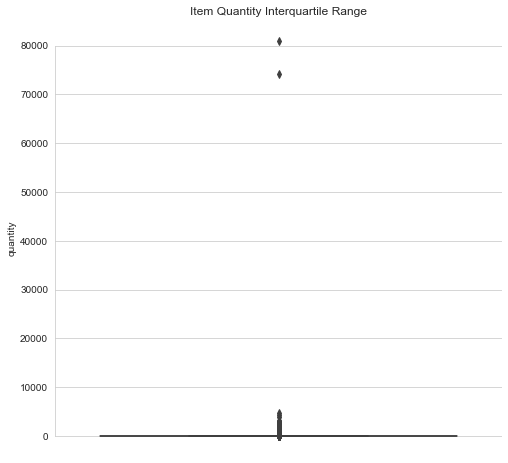

In [60]:
#plot IQR box plot
sns.set_style("whitegrid")
plt.figure(figsize=(8,8))
sns.boxplot(y= ec_orders['quantity']).set(title='Item Quantity Interquartile Range')
sns.despine(trim=True)
plt.show()

<span style='font-family:sabon;font-size:13pt'>
<b>Results:</b><br><br>
We see a few unreasonably high quantities.<br>
    We'll take a look at the top percentiles and decide which entries we want to remove from the analysis.
    </span>

In [61]:
#produce percentile report for 90, 95, and 99 percentiles
percentile_report(ec_orders['quantity'], [90, 95, 98, 99, 99.5])

quantity Percentile Report:


Minimum value: 1
90 Percentile: 24.0
___________________________________


95 Percentile: 30.0
___________________________________


98 Percentile: 72.0
___________________________________


99 Percentile: 100.0
___________________________________


99.5 Percentile: 160.0
___________________________________


Maximum value: 80995


<span style='font-family:sabon;font-size:13pt'>
<b>Results:</b><br><br>
The results show that 99% of the data contains invoices with individual quantities of 100 and under, we want to limit the data to such invoices, however if we do so we will lose almost 10% of our invoices.<br>
    Even though these are outliers by the interquartile range, these are still important data points for our analysis.<br>
    In this case we will keep invoices with item quantities of over 300, losing 2.4% of invoices for the sake of keeping our analysis strong.
    </span>

In [62]:
print('%rows to remove from data: {:.1%}'.format(ec_orders[ec_orders['quantity'] > 300].shape[0] / ec_orders.shape[0]))
print('%invoices to remove from data: {:.1%}'.format(ec_orders[ec_orders['quantity'] > 300]['invoice_id'].nunique() / ec_orders['invoice_id'].nunique()))

%rows to remove from data: 0.2%
%invoices to remove from data: 2.4%


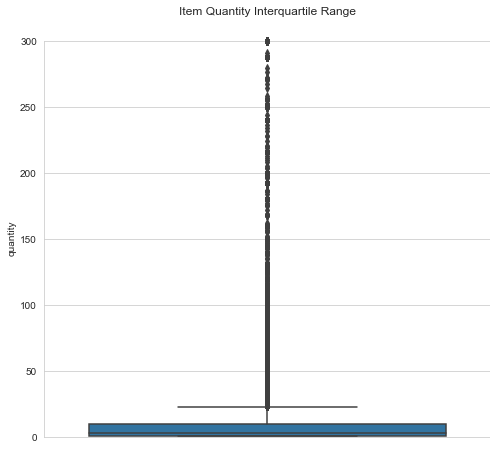

In [63]:
#define invoice ids that contains items with over 300 quantity
q_limit_ids = ec_orders[ec_orders['quantity'] > 300]['invoice_id'].unique()

#filter out the relevant ids
ec_orders = ec_orders[~ec_orders['invoice_id'].isin(q_limit_ids)]

#set name for reference
ec_orders.custom_name = 'orders'

#plot new IQR box plot
sns.set_style("whitegrid")
plt.figure(figsize=(8,8))
sns.boxplot(y= ec_orders['quantity']).set(title='Item Quantity Interquartile Range')
sns.despine(trim=True)
plt.show()

<a id="pp_conc"></a>
<h3>Conclusion</h3>

<span style='font-family:sabon;font-size:13pt;'>
   We examined the dataset a bit closer, tweaked, transformed and organized it in the following ways:<br><br>
   <ul>
      <li>Column names were transformed to be more intuitive and lower case.</li>
      <li>A date column without a specific timestamp was created for aggregation purposes.</li>
      <li>Duplicated rows were detected but we decided that they are not random and are part of the data so we left them in.</li>
      <li>We performed missing values analysis on the description column, during which:</li>
      <ul>
         <li>We removed rows we identified as internal transactions.</li>
         <li>We coalesced duplicate ids and descriptions together to create a 1:1 uniqueness ratio between descriptions and item ids.</li>
      </ul>
      <li>We performed missing values analysis on the customer_id column but found no way to imputate it.</li>
      <li>We investigated the invoice id column and found that there are invoices marked with the letter C that appear to be cancellations or returns from customers.</li>
      <li>We split the data into purchases and return invoices.</li>
      <li>We cleared out 0 sum invoices and invoices with outlying quantity values</li>
   </ul>
</span>

<a id='EDA'></a>
<h2>Exploring the Data and Seasonality Analysis</h2>

<a id='EDA_overview'></a>
<h3>Data Overview</h3>

In [64]:
#produce invoice distribution across the period in the data
for df in [ec_orders,ec_returns]:
    fig = px.histogram(
        df.drop_duplicates(subset='invoice_id'),
        x='invoice_date',
        template= 'seaborn',
        title='{} Invoice Distribution Over Time'.format(df.custom_name.title())
    )
    
    fig.show()

In [65]:
#aggregate items by total revenue
revenue_orders = ec_orders\
    .groupby('description',as_index=False)\
    .agg({'total_price' : 'sum'})\
    .sort_values('total_price', ascending=False)

revenue_orders['total_price'] = revenue_orders['total_price'].round(1)

In [66]:
#plot top 10 items by revenue bar chart
fig= px.bar(
    revenue_orders.head(10),
    x='total_price',
    y='description',
    color='description',
    text= 'total_price',
    title= 'Top 10 Items by Revenue'
)
fig.update_traces(
    showlegend=False,
    textposition='inside',
    textfont={
          'size' : 14,
          'family' : 'Arial Black'
              }
)

In [67]:
#show statistics for total revenue
revenue_orders.describe()

,total_price
count,3752.000000
mean,2299.656290
std,5615.690956
min,0.000000
25%,141.150000
50%,682.450000
75%,2091.900000
max,160422.200000


In [68]:
#show lowest 5% by revenue
lowest_rev = revenue_orders[revenue_orders['total_price'] < np.percentile(revenue_orders['total_price'], 5)]

print('Items in the lowest 5% revenue: {} ({:.1%} of items)'.format(
    lowest_rev.shape[0],
    lowest_rev.shape[0] / ec_orders['item_id'].nunique()
)
     )

print('5% revenue ceiling: {}'.format(lowest_rev['total_price'].max()))
print('\nTop 5 and Lowest 5 items in the 5th percentile:')
display(lowest_rev.head(), lowest_rev.tail())

Items in the lowest 5% revenue: 188 (5.0% of items)
5% revenue ceiling: 11.9

Top 5 and Lowest 5 items in the 5th percentile:


,description,total_price
415,BLUE GINGHAM ROSE CUSHION COVER,11.9
2301,PINK BAROQUE FLOCK CANDLE HOLDER,11.9
485,BLUE WHITE PLASTIC RINGS LAMPSHADE,11.9
1799,"LETTER ""Z"" BLING KEY RING",11.8
384,BLUE BREAKFAST CUP AND SAUCER,11.8


,description,total_price
1508,HAPPY BIRTHDAY CARD TEDDY/CAKE,1.0
2325,PINK CRYSTAL GUITAR PHONE CHARM,0.8
3443,VINTAGE BLUE TINSEL REEL,0.8
1546,HEN HOUSE W CHICK IN NEST,0.4
2164,PADS TO MATCH ALL CUSHIONS,0.0


<span style='font-family:sabon;font-size:13pt'>
   <b>Results:</b><br>
   <ul>
      <li>We can see the invoice count from Nov 29th 2018 to Dec 7th 2019.</li>
      <li>Invoice count rises towards the end of the year which makes sense as holidays roll in and sales happen in most stores.</li>
      <li>We found two especially successful items that bring in the most 
         revenue:<br><b>Regency Cake Stand 3 Tier <br>
         Party Bunting</b>
      </li>
      <li>188 items bring less than 11.9 in revenue throughout the period in the data.</li>
   </ul>
   <br>
   <b style='font-size: 15pt'>Slicing the Data for Seasonal Analysis:</b><br>
   In order to analyze the seasonality we will take a year long slice of the data from Dec 1st 2018 to Dec 1st 2019.<br>
   Optimally we would have the full data on December of 2019, however because we don't we will use the data from 2018, we will have to keep that in mind when analysing products that may have been introduced in 2019, for which we will observe a false "drop" in sales due to old data.
</span>

<a id='EDA_seasonal'></a>
<h3>Analyzing Seasonality</h3>

In [69]:
#set date limits
date_start = '12-01-18'
date_end = '12-01-19'

#define data slice using the date limits
sa_orders = ec_orders[
        (ec_orders['invoice_date'] >= date_start) & (ec_orders['invoice_date'] < date_end)
    ]

In [70]:
#generate pivot of unique invoice count over months
monthly_pivot = sa_orders.pivot_table(
    index='item_id',
    values='invoice_id',
    aggfunc='nunique',
    columns='invoice_month'
).fillna(0)

#create total invoice column
monthly_pivot['total'] = monthly_pivot.sum(axis=1)

#sort by total descending and drop total column
monthly_pivot = monthly_pivot.sort_values('total', ascending=False)

monthly_pivot.head()

invoice_month,1,2,3,4,5,6,7,8,9,10,11,12,total
item_id,,,,,,,,,,,,,
85123A,194.0,126.0,185.0,165.0,242.0,132.0,169.0,155.0,165.0,170.0,257.0,190.0,2150.0
85099B,138.0,109.0,158.0,122.0,198.0,170.0,189.0,184.0,197.0,195.0,241.0,102.0,2003.0
22423,145.0,130.0,182.0,169.0,197.0,127.0,142.0,140.0,139.0,175.0,205.0,151.0,1902.0
47566,68.0,83.0,149.0,193.0,252.0,194.0,189.0,155.0,132.0,98.0,94.0,48.0,1655.0
20725,95.0,98.0,119.0,108.0,154.0,134.0,142.0,159.0,140.0,125.0,156.0,77.0,1507.0


In [71]:
#calculate %invoices across months for each item
pivot_pct = monthly_pivot.div(monthly_pivot['total'], axis= 0)

pivot_pct.drop('total', axis=1).head()

invoice_month,1,2,3,4,5,6,7,8,9,10,11,12
item_id,,,,,,,,,,,,
85123A,0.090233,0.058605,0.086047,0.076744,0.112558,0.061395,0.078605,0.072093,0.076744,0.079070,0.119535,0.088372
85099B,0.068897,0.054418,0.078882,0.060909,0.098852,0.084873,0.094358,0.091862,0.098352,0.097354,0.120320,0.050924
22423,0.076236,0.068349,0.095689,0.088854,0.103575,0.066772,0.074658,0.073607,0.073081,0.092008,0.107781,0.079390
47566,0.041088,0.050151,0.090030,0.116616,0.152266,0.117221,0.114199,0.093656,0.079758,0.059215,0.056798,0.029003
20725,0.063039,0.065030,0.078965,0.071666,0.102190,0.088918,0.094227,0.105508,0.092900,0.082946,0.103517,0.051095


In [72]:
#calculate variance for seasonality isolation
pivot_pct['variance'] = pivot_pct.drop('total', axis=1).var(axis=1)

#reinstate total invoices column
pivot_pct['total_invoices'] = monthly_pivot['total']

pivot_pct.head()

invoice_month,1,2,3,4,5,6,7,8,9,10,11,12,total,variance,total_invoices
item_id,,,,,,,,,,,,,,,
85123A,0.090233,0.058605,0.086047,0.076744,0.112558,0.061395,0.078605,0.072093,0.076744,0.079070,0.119535,0.088372,1.0,0.000326,2150.0
85099B,0.068897,0.054418,0.078882,0.060909,0.098852,0.084873,0.094358,0.091862,0.098352,0.097354,0.120320,0.050924,1.0,0.000440,2003.0
22423,0.076236,0.068349,0.095689,0.088854,0.103575,0.066772,0.074658,0.073607,0.073081,0.092008,0.107781,0.079390,1.0,0.000191,1902.0
47566,0.041088,0.050151,0.090030,0.116616,0.152266,0.117221,0.114199,0.093656,0.079758,0.059215,0.056798,0.029003,1.0,0.001386,1655.0
20725,0.063039,0.065030,0.078965,0.071666,0.102190,0.088918,0.094227,0.105508,0.092900,0.082946,0.103517,0.051095,1.0,0.000313,1507.0


<span style='font-family:sabon;font-size:13pt'>
We'll create the Seasonality index which we define as:<br>
<b style='font-size:12pt'>variance of monthly %sales * total_invoices</b><br>
This will show us the combination of variance (to indicate seasonality) and item popularity (to reduce irrelevant results).<br>
    To avoid too much noise, we will be looking at items that appear in over 100 invoices.
    </span>

In [73]:
#filter for items with more than 500 invoices in the data
pivot_pct = pivot_pct[pivot_pct['total_invoices'] > 100]

#create seasonality index
pivot_pct['seasonality_index'] =    (pivot_pct['variance'] * pivot_pct['total_invoices']) 

#sort by seasonality index
pivot_pct = pivot_pct.sort_values('seasonality_index', ascending=False)

pivot_pct.head(5)

invoice_month,1,2,3,4,5,6,7,8,9,10,11,12,total,variance,total_invoices,seasonality_index
item_id,,,,,,,,,,,,,,,,
23084,0.000000,0.000000,0.000000,0.000000,0.110738,0.101790,0.042506,0.054810,0.029083,0.112975,0.548098,0.000000,1.0,0.023466,894.0,20.978340
23355,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.040673,0.274895,0.273492,0.410940,0.000000,1.0,0.021596,713.0,15.398051
22086,0.009524,0.004762,0.002857,0.004762,0.002857,0.006667,0.030476,0.033333,0.155238,0.236190,0.380000,0.133333,1.0,0.014633,1050.0,15.364935
23581,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.230000,0.770000,0.000000,1.0,0.051133,300.0,15.340000
23583,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.219081,0.780919,0.000000,1.0,0.052227,283.0,14.780249


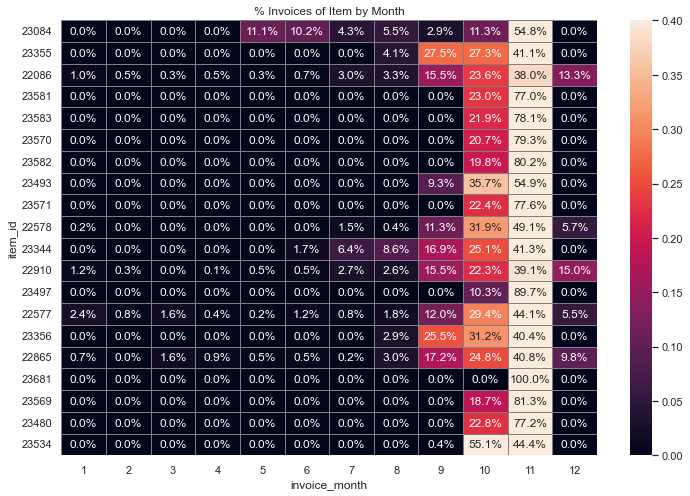

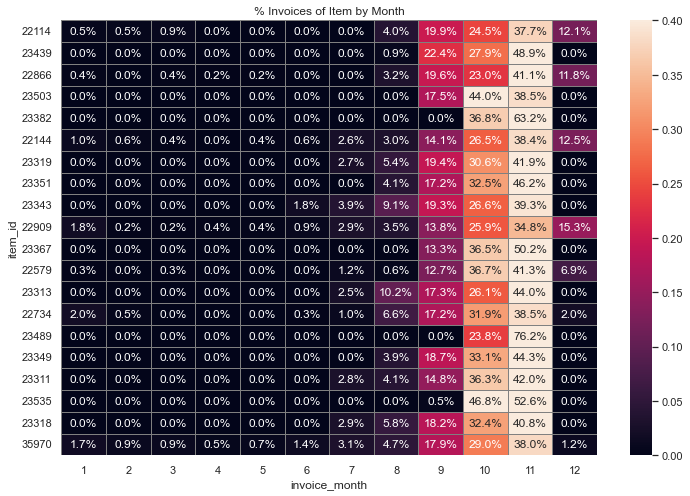

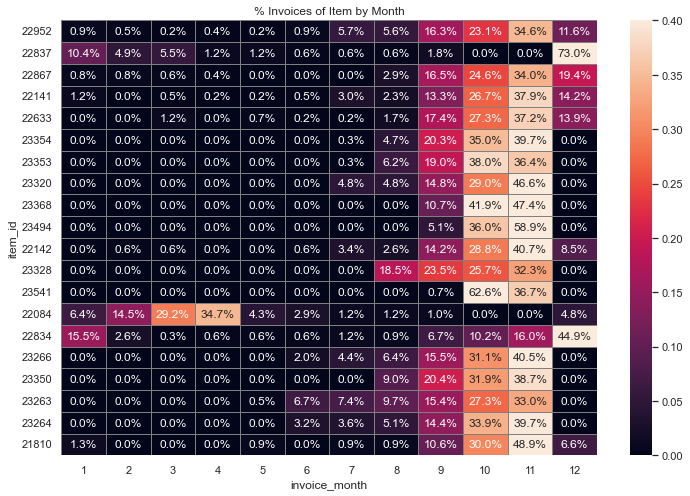

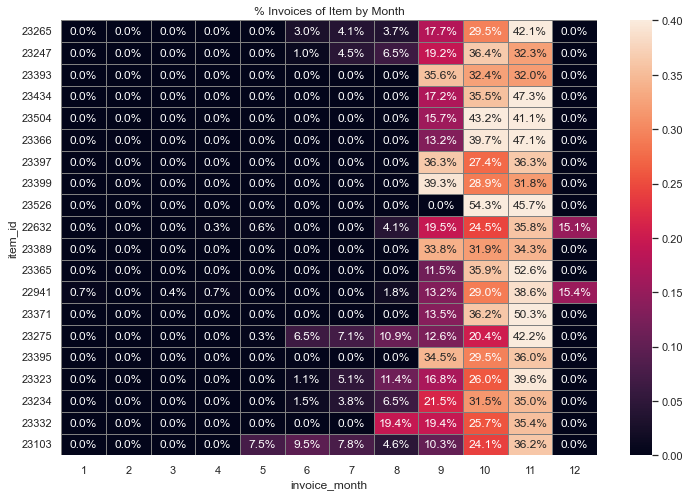

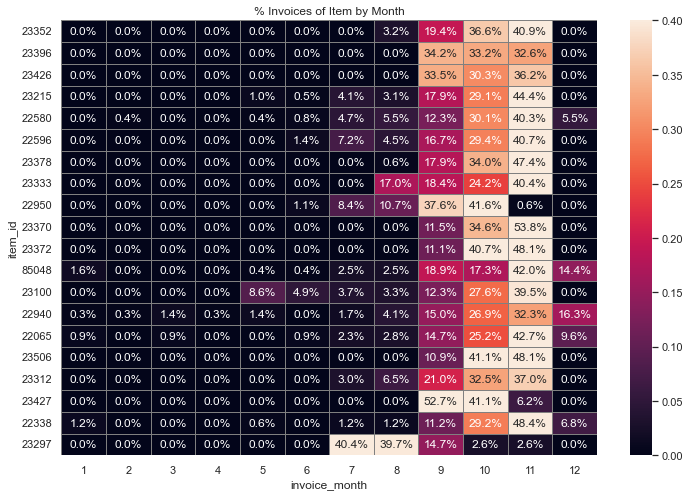

In [74]:
#define jump row index for plot loop
jumpstart = 0
jump = 20

#define variance threshold
variance_limiter= 0.012

#plot first 80 items using heatmap
for i in range(5):
    df = pivot_pct[pivot_pct['variance'] > variance_limiter].drop(['total','variance','total_invoices','seasonality_index'], axis=1)
    sns.set(style= 'white')
    plt.figure(figsize=(12, 8))
    plt.title('% Invoices of Item by Month')
    sns.heatmap(df.iloc[jumpstart:jump], annot=True, fmt='.1%', linewidths=1, linecolor='grey', vmax=0.4)
    plt.show()
    jump += 20
    jumpstart +=20

<span style='font-family:sabon;font-size:13pt'>
   <b>Results:</b><br>
   <ul>
      <li>We can see that for this store most seasonal items are during winter / christmas time.</li>
      <li>We can see a few examples of items trend during january to april, indicating Easter time.</li>
   </ul>
   We can see that we failed to accurately detect all seasonal items, so we will set an activity threshold of 0.25% average invoice% during september to november.<br>
   This will hopefully isolate the winter seasonal items for us.<br>
   Once we have our seasonal items, we will visualize and compare them to non seasonal items.
</span>

In [75]:
#set activity threshold
season_threshold = pivot_pct[pivot_pct['variance'] > variance_limiter][[9,10,11]].mean(axis= 1) > 0.25

#slice ids by activity threshold
dec_season_ids = pivot_pct[pivot_pct['variance'] > variance_limiter][season_threshold].index

#show sample of ids
print('Total seasonal items detected: {}'.format(dec_season_ids.shape[0]))
display(dec_season_ids[:5])

Total seasonal items detected: 166


Index(['23355', '22086', '23581', '23583', '23570'], dtype='object', name='item_id')

In [76]:
#define new df with only seasonal items
seasonal_analysis = sa_orders[sa_orders['item_id'].isin(dec_season_ids)]

#show sample of seasonal items chosen
seasonal_analysis\
    .drop_duplicates(subset=['item_id'])\
    .head(10)[['item_id','description']]

,item_id,description
5112,22065,CHRISTMAS PUDDING TRINKET POT
5118,22910,PAPER CHAIN KIT VINTAGE CHRISTMAS
5145,22632,HAND WARMER RED RETROSPOT
5146,22941,CHRISTMAS LIGHTS 10 REINDEER
5180,22865,HAND WARMER OWL DESIGN
5211,22086,PAPER CHAIN KIT 50'S CHRISTMAS
5213,22594,CHRISTMAS GINGHAM TREE
5228,22573,STAR WOODEN CHRISTMAS DECORATION
5229,22574,HEART WOODEN CHRISTMAS DECORATION
5277,22141,CHRISTMAS CRAFT TREE TOP ANGEL


<span style='font-family:sabon;font-size:13pt'>
<b>Results:</b><br><br>
So we can see from the preliminary results that most of the items align with the idea of seasonality.<br>
We see many christmas items, as well as winter items such as hot water bottles and possibly some items that are often purchased as gifts.
</span>

In [77]:
#scatter plot of seasonal items unique sales per month
seasonal_scatter = seasonal_analysis\
    .groupby(['item_id','invoice_month'])\
    .agg({'invoice_id' : 'nunique'})\
    .reset_index()

fig = px.scatter(
    seasonal_scatter,
    x='invoice_month',
    y='invoice_id',
    color='item_id',
    title= '#Invoices Each Month for Seasonal Items'
)

fig.show()

<a id='EDA_top10'></a>
<h3>Top 10 Products with Strong Seasonality Highlight</h3>

In [78]:
#define top seasonal items by revenue
top_seasonal = seasonal_analysis.groupby(['item_id']).agg({'total_price' : 'sum'}).reset_index()

#calculate share of revenue
top_seasonal['%revenue'] = (top_seasonal['total_price'] / top_seasonal['total_price'].sum()*100).round(1)

In [79]:
#slice top 10 seasonal items by share of revenue
top_seasonal = top_seasonal.sort_values('%revenue', ascending=False).head(10)['item_id']

#split top 1-5 and top 6-10 for plotting
top_seasonal = np.array_split(top_seasonal, 2)

In [80]:
#two step top 10 scatter plot
top= 5
for array in top_seasonal:
    scatter_data = seasonal_analysis[seasonal_analysis['item_id'].isin(array)].groupby(['description','invoice_month']).agg({'invoice_id' : 'nunique'}).reset_index()
    fig = px.scatter(scatter_data,
                    x='invoice_month',
                    y='invoice_id',
                    color='description',
                    title='#Invoices Each Month for Top{}-{} %revenue Seasonal Items'.format(top-4, top)
              )

    fig.show()
    top += 5

In [81]:
#show distribution of #winter seasonal items sold over months
fig = px.histogram(
    seasonal_analysis,
    x='invoice_month',
    template='seaborn',
    title= '#Items sold(one or more) Winter Seasonal Items Across Months'
)
fig.show()

<span style='font-family:sabon;font-size:13pt'>
<b>Results:</b><br><br>
The top 10 seasonal items are heavily and clearly skewed towards seasonal items, containing christmas and winter related items.<br>
We can see that most items peak between august and december.<br><br>
Apparently during winter people love making paper chains and keeping calm with their epic hot water bottles, we have to send an email to marketing immediately!!!<br>
</span>

<a id='EDA_vs'></a>
<h3>Profitability of Seasonal Products vs Non-Seasonal Products</h3>

In [82]:
#add column indicator of seasonality
sa_orders['is_seasonal'] = sa_orders.apply(
        lambda x: True if x['item_id'] in (dec_season_ids) else False,
        axis=1
    )

In [83]:
#define colors
custom_color =  {False : '#5C377D', True : '#ffafcc'}

#plot seasonal vs non seasonal 
fig= px.histogram(
    sa_orders,
    x='invoice_month',
    color='is_seasonal',
    color_discrete_map = custom_color,
    title= 'Seasonal vs Non Seasonal Items Sale Count Per Month'
)
fig.show()

In [84]:
#define dates for analysis
date_start = '09-01-19'
date_end = '12-01-19'

#slice data by dates
sa_vs = sa_orders[(sa_orders['invoice_date'] >= date_start) & (sa_orders['invoice_date'] < date_end)]
sa_vs.sample(2)

,invoice_id,item_id,description,quantity,invoice_ts,unit_price,customer_id,invoice_date,invoice_month,total_price,is_seasonal
384811,571098,22386,JUMBO BAG PINK POLKADOT,10,2019-10-11 15:38:00,2.08,17841.0,2019-10-11,10,20.80,False
490975,579069,23122,PARTY CHARMS 50 PIECES,12,2019-11-26 10:31:00,0.83,14911.0,2019-11-26,11,9.96,False


In [85]:
#define pie data
sa_pie = sa_vs.groupby('is_seasonal', as_index=False).agg({'total_price' : 'sum'})

#plot pie chart
fig = px.pie(
    sa_pie,
    values='total_price',
    labels= 'is_seasonal',
    color_discrete_sequence = [custom_color[False], custom_color[True]],
    title='Winter %Revenue of Seasonal Items vs Non-Seasonal'
)

fig.update_layout(
title_font_size=20,
title_font_family = 'Arial Black',
legend_font_size = 20,
legend_font_family = 'Arial Black'
    )

fig.update_traces(textposition='auto',
              textinfo='percent+label+value',
              textfont={
                  'size' : 18,
                  'family' : 'Arial Black'
              }
             )
fig.show()

<span style='font-family:sabon;font-size:13pt'>
<b>Results:</b><br><br>
We see that the seasonal items bring 19.3% of the revenue during the period between september and the end of november.<br>
This rather high %, comes from merely 168 items out of almost 4000 in the catalogue, boosting this % higher is not impossible when we know which items to promote and when!
</span>

<a id='EDA_conc'></a>
<h3>Conclusion</h3>

<span style='font-family:sabon;font-size:13pt'>
   We performed analysis on the most prominent seasonal period evident in the data which we found to be winter time, specifically the beginning of september to the end of november.<br>
   <b>Some of the interesting results we found during the analysis:</b><br>
   <ul>
      <li>We detected 168 seasonal items in the data.</li>
      <li>Invoice count rises towards the end of the year as the cold weather and holidays roll in</li>
      <li>The top 10 seasonal items contain christmas and winter related items.<br>
      <li>Seasonal items bring 19.3% of the revenue during the period between september and the end of november.<br>
   </ul>
</span>

<a id='MBA'></a>
<h2>Market Basket Analysis</h2>

<span style='font-family:sabon;font-size:13pt'>
   In this part we perform a market basket analysis.<br>
   The purpose of this analysis is to detect items which are often picked by customers and bought together.<br>
   Once we have information about such bundled items we can employ it in many different ways:<br>
   <ul>
      <li>Improve our recommendation system.</li>
      <li>Improve our control over bundle-dependent inventory quantities.</li>
      <li>Come up with smarter marketing campaign that speak to the customers needs.</li>
   </ul>
   And potentially many more!<br>
   So let's get to it!
</span>

In [86]:
#prepare data for basket analysis
basket_prep = ec_orders.pivot_table(index='invoice_id', columns= 'description', values='quantity').fillna(0)

#force binary one hot encoding on dataset
basket_prep = basket_prep.applymap(binary_encode)

#show sample
basket_prep.sample(5, random_state=1)

description,10 COLOUR SPACEBOY PEN,12 COLOURED PARTY BALLOONS,12 DAISY PEGS IN WOOD BOX,12 EGG HOUSE PAINTED WOOD,12 HANGING EGGS HAND PAINTED,12 IVORY ROSE PEG PLACE SETTINGS,12 MESSAGE CARDS WITH ENVELOPES,12 PENCIL SMALL TUBE WOODLAND,12 PENCILS SMALL TUBE RED RETROSPOT,12 PENCILS SMALL TUBE SKULL,...,ZINC HERB GARDEN CONTAINER,ZINC METAL HEART DECORATION,ZINC SWEETHEART SOAP DISH,ZINC SWEETHEART WIRE LETTER RACK,ZINC T-LIGHT HOLDER STAR LARGE,ZINC T-LIGHT HOLDER STARS SMALL,ZINC TOP 2 DOOR WOODEN SHELF,ZINC WILLIE WINKIE CANDLE STICK,ZINC WIRE KITCHEN ORGANISER,ZINC WIRE SWEETHEART LETTER TRAY
invoice_id,,,,,,,,,,,,,,,,,,,,,
542360,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
558233,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
561911,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
574545,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
574657,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


<a id='MBA_itemset'></a>
<h3>Creating Itemsets</h3>

In [87]:
#generate itemsets using apriori algorithm
frequent_itemsets = apriori(basket_prep, min_support = 0.015, use_colnames = True, low_memory=True)

In [88]:
#show result
frequent_itemsets.sort_values('support',ascending=False).head()

,support,itemsets
468,0.116021,(WHITE HANGING HEART T-LIGHT HOLDER)
191,0.106789,(JUMBO BAG RED RETROSPOT)
331,0.101706,(REGENCY CAKESTAND 3 TIER)
268,0.086873,(PARTY BUNTING)
223,0.080390,(LUNCH BAG RED RETROSPOT)


In [89]:
#apply association rules
rules = association_rules(frequent_itemsets, metric = 'confidence', min_threshold = 0.2)

#sort by confidence top 10
rules.sort_values('confidence', ascending=False).head(5)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
704,"(PINK REGENCY TEACUP AND SAUCER, REGENCY CAKES...",(GREEN REGENCY TEACUP AND SAUCER),0.016752,0.051761,0.015196,0.907121,17.525246,0.014329,10.209375
518,"(PINK REGENCY TEACUP AND SAUCER, ROSES REGENCY...",(GREEN REGENCY TEACUP AND SAUCER),0.030393,0.051761,0.027488,0.904437,17.473394,0.025915,9.922646
703,"(PINK REGENCY TEACUP AND SAUCER, REGENCY CAKES...",(ROSES REGENCY TEACUP AND SAUCER),0.017323,0.054095,0.015196,0.877246,16.216846,0.014259,7.705668
512,"(PINK REGENCY TEACUP AND SAUCER, REGENCY CAKES...",(GREEN REGENCY TEACUP AND SAUCER),0.019760,0.051761,0.017323,0.876640,16.936377,0.016300,7.686790
484,"(CHARLOTTE BAG PINK POLKADOT, STRAWBERRY CHARL...",(RED RETROSPOT CHARLOTTE BAG),0.019449,0.052954,0.016804,0.864000,16.316145,0.015774,6.963576


In [90]:
#we'll set confidence and lift thresholds by their means in the rules we found
confidence_threshold = rules['confidence'].mean()
lift_threshold = rules['lift'].mean()

#filter rules
rules = rules[
        (rules['confidence'] >= confidence_threshold) & (rules['lift'] >= lift_threshold)
    ].sort_values('confidence', ascending=False)

#produce rules filtered results
print('Rules count after filter: {}'.format(rules.shape[0]))
print('Top matches:\n')
display(rules.head(10))

Rules count after filter: 175
Top matches:



,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
704,"(PINK REGENCY TEACUP AND SAUCER, REGENCY CAKES...",(GREEN REGENCY TEACUP AND SAUCER),0.016752,0.051761,0.015196,0.907121,17.525246,0.014329,10.209375
518,"(PINK REGENCY TEACUP AND SAUCER, ROSES REGENCY...",(GREEN REGENCY TEACUP AND SAUCER),0.030393,0.051761,0.027488,0.904437,17.473394,0.025915,9.922646
703,"(PINK REGENCY TEACUP AND SAUCER, REGENCY CAKES...",(ROSES REGENCY TEACUP AND SAUCER),0.017323,0.054095,0.015196,0.877246,16.216846,0.014259,7.705668
512,"(PINK REGENCY TEACUP AND SAUCER, REGENCY CAKES...",(GREEN REGENCY TEACUP AND SAUCER),0.019760,0.051761,0.017323,0.876640,16.936377,0.016300,7.686790
484,"(CHARLOTTE BAG PINK POLKADOT, STRAWBERRY CHARL...",(RED RETROSPOT CHARLOTTE BAG),0.019449,0.052954,0.016804,0.864000,16.316145,0.015774,6.963576
517,"(PINK REGENCY TEACUP AND SAUCER, GREEN REGENCY...",(ROSES REGENCY TEACUP AND SAUCER),0.032156,0.054095,0.027488,0.854839,15.802632,0.025749,6.516236
692,"(PINK REGENCY TEACUP AND SAUCER, REGENCY CAKES...",(ROSES REGENCY TEACUP AND SAUCER),0.019760,0.054095,0.016752,0.847769,15.671941,0.015683,6.213619
432,(REGENCY TEA PLATE GREEN),(REGENCY TEA PLATE ROSES),0.019294,0.022302,0.016182,0.838710,37.607352,0.015751,6.061729
74,(PINK REGENCY TEACUP AND SAUCER),(GREEN REGENCY TEACUP AND SAUCER),0.038847,0.051761,0.032156,0.827770,15.992225,0.030145,5.505668
490,"(CHARLOTTE BAG PINK POLKADOT, WOODLAND CHARLOT...",(RED RETROSPOT CHARLOTTE BAG),0.020331,0.052954,0.016804,0.826531,15.608557,0.015728,5.459443


<span style='font-family:sabon;font-size:13pt'>
<b>Results:</b><br><br>
We can see many bundles with very high confidence. These items have very strong connections and are very often sold together!<br>
These bundles can already be used by marketing and other departments to maximize sales and produce recommendations.<br><br>
For us, we want to see that these results make sense in real life.<br> In order to do that we will be looking at the top 5 bundles and plot each item in the bundle against the other.<br>
For simplicity we will use only mono antecedent bundles.
</span>

<a id='MBA_bundles'></a>
<h3>Top 5 Bundles</h3>

In [91]:
#create binary column to distinguish between multiple and mono antecedent rules
rules['multiple_ante'] = rules.apply(lambda x: 1 if len(list(x['antecedents'])) > 1 else 0, axis=1)

In [92]:
#define top rules
top5_rules = rules[rules['multiple_ante'] == 0][
    ['antecedents','consequents','support','confidence','lift']
    ].sort_values('confidence', ascending=False).head(5)
top5_rules

,antecedents,consequents,support,confidence,lift
432,(REGENCY TEA PLATE GREEN),(REGENCY TEA PLATE ROSES),0.016182,0.838710,37.607352
74,(PINK REGENCY TEACUP AND SAUCER),(GREEN REGENCY TEACUP AND SAUCER),0.032156,0.827770,15.992225
449,(SET/6 RED SPOTTY PAPER CUPS),(SET/6 RED SPOTTY PAPER PLATES),0.017893,0.817536,30.607578
410,(PINK REGENCY TEACUP AND SAUCER),(ROSES REGENCY TEACUP AND SAUCER),0.030393,0.782377,14.463089
451,(SMALL MARSHMALLOWS PINK BOWL),(SMALL DOLLY MIX DESIGN ORANGE BOWL),0.017997,0.779775,28.637804


In [93]:
#plot top 5 bundled items sales by month
for row in top5_rules[['antecedents','consequents']].itertuples():
    
#here we use list() to convert frozenset to strings
    antecedent = list(getattr(row, 'antecedents'))[0]
    consequent = list(getattr(row, 'consequents'))[0]
    
    df_visual = ec_orders[ec_orders['description'].isin([antecedent, consequent])]
    df_visual = df_visual.\
        groupby(['description','invoice_month']).\
        agg({'invoice_id' : 'nunique'})\
        .reset_index().rename(columns= {'invoice_id' : 'invoice_count'})
    
    fig = px.line(
        df_visual,
        x='invoice_month',
        y='invoice_count',
        color='description',
        color_discrete_map = {antecedent : '#69BD69', consequent : '#5A4D65'}
    )
    fig.update_layout(
        template='seaborn',
        title= dict(
            font_size= 20, 
            text= '#Transactions for Bundle: {} -> {}'.format(antecedent.lower(), consequent.lower())
        ),
        xaxis= dict(title = 'Month'),
        yaxis= dict(title = 'Unique Invoice Count')
                 )
    fig.show()

<span style='font-family:sabon;font-size:13pt'>
<b>Results:</b><br><br>
We can see that our results seem to be grounded in reality, with the graphs for each item in each bundle following fairly closely with each other!<br>
    But without some kind of comparison it's not that convincing so let's create a few control graphs:
    </span>

In [94]:
#plot control graph
for rand in random.sample(range(0, 1000), 3):
    antecedent = ec_orders['description'].sample(2, random_state= rand).iloc[0]
    consequent = ec_orders['description'].sample(2, random_state= rand).iloc[1]

    df_visual = ec_orders[ec_orders['description'].isin([antecedent, consequent])]
    df_visual = df_visual.\
        groupby(['description','invoice_month']).\
        agg({'invoice_id' : 'nunique'})\
        .reset_index().rename(columns= {'invoice_id' : 'invoice_count'})
    fig = px.line(
        df_visual,
        x='invoice_month',
        y='invoice_count',
        color='description',
        color_discrete_map = {antecedent : '#69BD69', consequent : '#5A4D65'}
    )
    
    fig.update_layout(
        template='seaborn',
        title= dict(
            font_size= 20, 
            text= '#Transactions for items: {} + {}'.format(antecedent.lower(), consequent.lower())
        ),
        xaxis= dict(title = 'Month'),
        yaxis= dict(title = 'Unique Invoice Count')
                 )
    fig.show()

<span style='font-family:sabon;font-size:13pt'>
<b>Results:</b><br><br>
These look nothing like our graphs! looks like we're really on to something.
    </span>

<a id='MBA_hunt'></a>
<h3>Hunting for Unlikely Combinations</h3>

<span style='font-family:sabon;font-size:13pt'>
We've seen that with high confidence we can detect combinations that make a lot of sense.<br>
But what about combinations that are less instantly logical to us?<br>
To search for these we would have to lower our Confidence and Support parameters in an attempt to uncover unlikely combinations.<br>
Let's find out if we can find any!
</span>

In [95]:
#create associations for unlikely rules
unlikely_rules = association_rules(frequent_itemsets, metric = 'confidence', min_threshold = 0.2)

In [96]:
#define confidence and support
confidence_mask = (unlikely_rules['confidence'] > 0.3) & (unlikely_rules['confidence'] < 0.7)
support_mask = (unlikely_rules['support'] < 0.017)

#create custom parameters combining support, confidence and lift
unlikely_rules['lift_support'] = unlikely_rules['lift'] * unlikely_rules['support']
unlikely_rules['final_confidence'] = unlikely_rules['lift_support'] * unlikely_rules['confidence']

unlikely_rules.describe()

,antecedent support,consequent support,support,confidence,lift,leverage,conviction,lift_support,final_confidence
count,716.000000,716.000000,716.000000,716.000000,716.000000,716.000000,716.000000,716.000000,716.000000
mean,0.049154,0.054323,0.019111,0.435927,9.345074,0.016449,1.906531,0.175685,0.085333
std,0.018535,0.023705,0.004600,0.159645,4.980511,0.004187,0.959724,0.094719,0.074444
min,0.016752,0.016752,0.015041,0.200097,1.851723,0.007944,1.125857,0.031981,0.006871
25%,0.034697,0.036720,0.016026,0.299198,6.266306,0.014045,1.357862,0.118266,0.037676
50%,0.050153,0.052954,0.017193,0.411063,8.269867,0.015237,1.606993,0.152842,0.068336
75%,0.061304,0.062912,0.020798,0.547219,11.274788,0.017998,2.068173,0.213241,0.101365
max,0.116021,0.116021,0.042166,0.907121,37.607352,0.036254,10.209375,0.608552,0.510399


<span style='font-family:sabon;font-size:13pt'>
    We'll set a final confidence level slightly under the median (0.07)
    </span>

In [97]:
#set final confidence mask
final_confidence = (unlikely_rules['final_confidence'] < 0.05)

In [98]:
#filter rules
unlikely_rules = unlikely_rules[confidence_mask & support_mask & final_confidence].sort_values('final_confidence', ascending=True).head(10)

#show results with confidence highlight
unlikely_rules\
    .drop(['leverage','conviction','lift_support'], axis=1)\
    .reset_index(drop=True)\
    .style.background_gradient(subset=['confidence'],cmap='summer_r')

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,final_confidence
0,frozenset({'RED TOADSTOOL LED NIGHT LIGHT'}),frozenset({'JUMBO BAG RED RETROSPOT'}),0.043203,0.106789,0.015300,0.354142,3.316273,0.017969
1,frozenset({'WOODLAND CHARLOTTE BAG'}),frozenset({'JUMBO BAG RED RETROSPOT'}),0.042685,0.106789,0.015196,0.356015,3.333811,0.018036
2,frozenset({'SET OF 3 REGENCY CAKE TINS'}),frozenset({'REGENCY CAKESTAND 3 TIER'}),0.044137,0.101706,0.015507,0.351351,3.454567,0.018822
3,frozenset({'CHARLOTTE BAG SUKI DESIGN'}),frozenset({'JUMBO BAG RED RETROSPOT'}),0.045226,0.106789,0.016597,0.366972,3.436424,0.020930
4,frozenset({'SET/20 RED RETROSPOT PAPER NAPKINS'}),frozenset({'PACK OF 72 RETROSPOT CAKE CASES'}),0.050257,0.067061,0.015456,0.307534,4.585889,0.021797
5,frozenset({'RED RETROSPOT CHARLOTTE BAG'}),frozenset({'PACK OF 72 RETROSPOT CAKE CASES'}),0.052954,0.067061,0.016389,0.309500,4.615220,0.023411
6,frozenset({'RED RETROSPOT CHARLOTTE BAG'}),frozenset({'LUNCH BAG SUKI DESIGN'}),0.052954,0.066024,0.016493,0.311459,4.717398,0.024233
7,frozenset({'JUMBO BAG ALPHABET'}),frozenset({'JUMBO STORAGE BAG SUKI'}),0.046367,0.061304,0.015144,0.326622,5.327917,0.026355
8,frozenset({'WOODLAND CHARLOTTE BAG'}),frozenset({'LUNCH BAG RED RETROSPOT'}),0.042685,0.080390,0.015767,0.369380,4.594853,0.026760
9,frozenset({'CHARLOTTE BAG SUKI DESIGN'}),frozenset({'LUNCH BAG BLACK SKULL.'}),0.045226,0.065609,0.015767,0.348624,5.313689,0.029208


In [99]:
#plot top 10 unlikely bundled items sales by month
for row in unlikely_rules[['antecedents','consequents']].itertuples():
    
#here we use list() to convert frozenset to strings
    antecedent = list(getattr(row, 'antecedents'))[0]
    consequent = list(getattr(row, 'consequents'))[0]
    
    df_visual = ec_orders[ec_orders['description'].isin([antecedent, consequent])]
    df_visual = df_visual.\
        groupby(['description','invoice_month']).\
        agg({'invoice_id' : 'nunique'})\
        .reset_index().rename(columns= {'invoice_id' : 'invoice_count'})
    
    fig = px.line(
        df_visual,
        x='invoice_month',
        y='invoice_count',
        color='description',
        color_discrete_map = {antecedent : '#69BD69', consequent : '#5A4D65'}
    )
    fig.update_layout(
        template='seaborn',
        title= dict(
            font_size= 20, 
            text= '#Transactions for Bundle: {} -> {}'.format(antecedent.lower(), consequent.lower())
        ),
        xaxis= dict(title = 'Month'),
        yaxis= dict(title = 'Unique Invoice Count')
                 )
    fig.show()

<span style='font-family:sabon;font-size:13pt'>
<b>Results:</b><br><br>
Even with low confidence, support and lift scores, most of the results tend to be combinations of items of the same category.<br>
We found a few exceptions, however with such low confidence it's hard to say the combination is anything but random.<br>
Looks like we need to come back next year when we have another 5000 or so transactions to process!
</span>

<a id='MBA_conc'></a>
<h3>Conclusion</h3>

<span style='font-family:sabon;font-size:13pt;'>
We set out to detect products that are often bundled together in user purchases.<br>By Using the Apriori algorithm we detected 165 association rules with high confidence.<br><br>
We continued to validate our results by plotting monthly sales statistics of each pair and found that they were indeed very similar in their trends!<br>
This priceless information can now be passed on to marketing and developement where item bundles can be created as well as push the developement of an efficient recommendation system.<br><br>
Furthermore, in an attempt to search for unlikely combinations, we lowered the parameters thresholds, however we did not find convincing bundles in this way.<br><br>
</span>

<a id='FDA'></a>
<h2>Analyzing First Transactions</h2>

<span style='font-family:sabon;font-size:13pt;'>
In this part we take a look at the item variety in customers first transactions.<br>
The purpose of this analysis is to determine which products attract users to our company in the first place and <b>turns them from complete strangers to customers.</b><br>
If we can find such items, we'll be able to recommend them to new users and convert them to customers.
</span>

In [100]:
#pull first invoice date for each customer
first_date = ec_orders.sort_values('invoice_date').groupby(['customer_id'], as_index=False).agg({'invoice_date' : 'min', 'invoice_id' : 'first'})

#merge main df to first dates while keeping the details of each transaction for each customer
fd_analysis = first_date.merge(ec_orders, how='inner', on=['customer_id', 'invoice_date', 'invoice_id'])

#define first invoices for later comparison
fd_invoices = first_date['invoice_id'].unique()

fd_analysis.head()

,customer_id,invoice_date,invoice_id,item_id,description,quantity,invoice_ts,unit_price,invoice_month,total_price
0,12347.0,2018-12-05,537626,85116,BLACK CANDELABRA T-LIGHT HOLDER,12,2018-12-05 14:57:00,2.10,12,25.2
1,12347.0,2018-12-05,537626,22375,AIRLINE BAG VINTAGE JET SET BROWN,4,2018-12-05 14:57:00,4.25,12,17.0
2,12347.0,2018-12-05,537626,71477,COLOUR GLASS. STAR T-LIGHT HOLDER,12,2018-12-05 14:57:00,3.25,12,39.0
3,12347.0,2018-12-05,537626,22492,MINI PAINT SET VINTAGE,36,2018-12-05 14:57:00,0.65,12,23.4
4,12347.0,2018-12-05,537626,22771,CLEAR DRAWER KNOB ACRYLIC EDWARDIAN,12,2018-12-05 14:57:00,1.25,12,15.0


In [101]:
#aggregate items from first transactions and count their appearance
fd_analysis = fd_analysis\
                .groupby('description')\
                .count()[['invoice_id']]\
                .rename(columns= {'invoice_id' : 'count'})\
                .sort_values('count', ascending=False)

#perform the same aggregation for non-first-date orders
non_fd_orders = ec_orders[~(ec_orders['invoice_id'].isin(fd_invoices))].dropna().groupby('description').count()[['invoice_id']].rename(columns= {'invoice_id' : 'count'}).sort_values('count', ascending=False)

#define top 10 first purchase items
top_first_items = fd_analysis.head(10).index

#filter for top 10 first purchase items
fd_analysis = fd_analysis[fd_analysis.index.isin(top_first_items)]
non_fd_orders = non_fd_orders[non_fd_orders.index.isin(top_first_items)]

#display dataframes
display(non_fd_orders,fd_analysis)

,count
description,
WHITE HANGING HEART T-LIGHT HOLDER,1435
REGENCY CAKESTAND 3 TIER,1189
PARTY BUNTING,1047
ASSORTED COLOUR BIRD ORNAMENT,1010
SET OF 3 CAKE TINS PANTRY DESIGN,793
PACK OF 72 RETROSPOT CAKE CASES,719
NATURAL SLATE HEART CHALKBOARD,662
REX CASH+CARRY JUMBO SHOPPER,641
JAM MAKING SET PRINTED,538


,count
description,
WHITE HANGING HEART T-LIGHT HOLDER,573
REGENCY CAKESTAND 3 TIER,508
ASSORTED COLOUR BIRD ORNAMENT,391
JAM MAKING SET WITH JARS,350
SET OF 3 CAKE TINS PANTRY DESIGN,346
PARTY BUNTING,340
PACK OF 72 RETROSPOT CAKE CASES,323
JAM MAKING SET PRINTED,320
NATURAL SLATE HEART CHALKBOARD,312


In [102]:
#generate joint bar plot for first date items and non-first-date items
fig = go.Figure(
    go.Bar(
        y=fd_analysis.index,
        x=fd_analysis['count'],
        text= fd_analysis['count'],
        name= 'First Purchases',
        orientation='h',
        marker_color = '#8FC861'
        )
    )
fig.add_trace(
    go.Bar(
        y=non_fd_orders.index,
        x=non_fd_orders['count'],
        text= non_fd_orders['count'],
        name= 'Non-First Purchases',
        orientation='h',
        marker_color = '#a3acb1'
        )
    )

fig.update_traces(
    textposition='outside',
    textfont={
          'size' : 20,
          'family' : 'Arial Black'
              }
)
fig.update_layout(
    title= dict(
    font_size= 20,
    text= 'Item Sale Count in First vs Non-First Purchases'
    )
)
fig.show()

<a id='FDA_conc'></a>
<h3>Conclusion</h3>

<span style='font-family:sabon;font-size:13pt'>
   We can see that some of the first purchase items have quite high sales compared to the normal purchases.<br>
   <ul>
      <li>Jam making set with jars</li>
      <li>Pack of 72 Retrospot Cake Cases</li>
      <li>Jam Making Set Printed</li>
      <li>Natural Slate Heart Chalkboard</li>
      <li>Rex Cash+ Carry Jumpo Shopper</li>
   </ul>
   These items could be what draw users to the website in the first place.<br>
   Perhaps there is something to them that piques users interest?<br>
   If so, this information will be useful to the marketing team.<br>
   We will run statistical tests on these items to figure out if there is meaning behind their frequency of appearance in first purchases.
</span>

<a id='testing'></a>
<h2>Hypothesis Testing</h2>

<a id='testing_h1'></a>
<h3>Does sale average change significantly during previously detected seasonal periods compared to normal periods?</h3>

<span style='font-family:sabon;font-size:13pt'>
We'll be looking at the seasonal period: September 01 - November 30<br>
    Statistical Significance level: <b>0.05</b>
    </span>

<a id='testing_h1_sample'></a>
<h4>Sample Creation</h4>

In [103]:
#create season period mask
season_mask = ec_orders['invoice_month'].isin([9,10,11])

#define samples by period
seasonal_sales = ec_orders[season_mask]
other_sales = ec_orders[~season_mask]

In [104]:
#aggregate invoice sums
seasonal_sample = seasonal_sales.groupby('invoice_id').agg({'total_price' : 'sum'}).reset_index(drop=True)['total_price']
print('sample size: {}'.format(seasonal_sample.shape[0]))

#name sample
seasonal_sample.name = 'seasonal'

seasonal_sample.head()

sample size: 6769


0    139.12
1     22.20
2    278.73
3     70.05
4     17.85
Name: seasonal, dtype: float64

<span style='font-family:sabon;font-size:13pt'>
Before we continue, we want to remove any outliers from the sample
    </span>

<a id='testing_h1_outliers1'></a>
<h4>Processing Outliers</h4>

In [105]:
#produce percentile report
percentile_report(seasonal_sample)

seasonal Percentile Report:


Minimum value: 0.38
1 Percentile: 5.95
___________________________________


5 Percentile: 31.93800000000001
___________________________________


95 Percentile: 1396.4279999999987
___________________________________


99 Percentile: 3993.973599999995
___________________________________


Maximum value: 22206.0


In [106]:
#set sample limit at percentile 99
sample_limit = np.percentile(seasonal_sample, 99)

#filter sample
seasonal_sample = seasonal_sample[seasonal_sample < sample_limit]

In [107]:
other_sales_sample = other_sales.groupby('invoice_id').agg({'total_price' : 'sum'}).reset_index(drop=True)['total_price']
print('sample size: {}'.format(other_sales_sample.shape[0]))

#name sample
other_sales_sample.name = 'Non Seasonal'
other_sales_sample.head()

sample size: 12512


0     215.58
1     534.00
2     397.50
3    1368.40
4      71.14
Name: Non Seasonal, dtype: float64

<span style='font-family:sabon;font-size:13pt'>
Again, we want to remove any outliers from the sample
    </span>

<a id='testing_h1_outliers2'></a>
<h4>Processing Outliers</h4>

In [108]:
#produce percentile report
percentile_report(other_sales_sample)

Non Seasonal Percentile Report:


Minimum value: 0.42
1 Percentile: 4.5499
___________________________________


5 Percentile: 20.391000000000002
___________________________________


95 Percentile: 1283.3664999999985
___________________________________


99 Percentile: 3277.0298999999986
___________________________________


Maximum value: 38970.0


In [109]:
#set sample limit at percentile 99
sample_limit = np.percentile(other_sales_sample, 99)

#filter sample
other_sales_sample = other_sales_sample[other_sales_sample < sample_limit]

<a id='testing_h1_shapiro'></a>
<h4>Testing for Normal Distribution</h4>

pvalue is 0.0
We reject the null hypothesis
No significant evidence for normal distribution


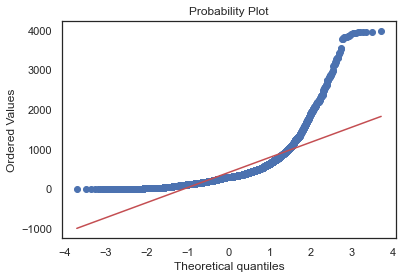

pvalue is 0.0
We reject the null hypothesis
No significant evidence for normal distribution


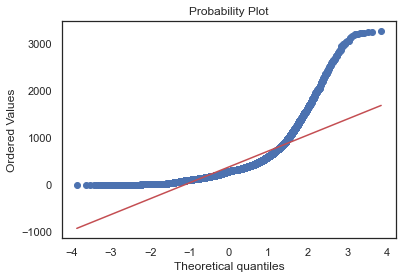

In [110]:
#run shapiro test for normal distribution
for sample in [seasonal_sample,other_sales_sample]:
    shapiro_result(sample)

<span style='font-family:sabon;font-size:13pt'>
<b>Results:</b><br>
The distribution is not normal.<br>
Because our sample is not distributed normally, we will proceed with the <b>non-parametric mann whitney u test.</b>
</span>

<a id='testing_h1_test'></a>
<h4>Mann Whitney U Testing</h4>

In [111]:
#perform non-parametric test on the samples
mann_whitney_result(seasonal_sample,other_sales_sample)

Significance Level: 0.05
pvalue is 0.0000
We reject the null hypothesis
No significant evidence that the two statistical populations are the same


,sample_1,sample_1_avg,sample_2,sample_2_avg,alpha,p_value,reject_h0
0,seasonal,417.36,Non Seasonal,379.6,0.05,0.0,1


<span style='font-family:sabon;font-size:13pt'>
<b>Results:</b><br><br>
We tested for normality, however our samples do not fall under that category.<br>
Therefore we decided to perform the mann whitney u test, which is non parametric and not affected by the distribution.<br><br>
Our results clearly show that the two periods tested are significantly different.<br>
With the seasonal period producing higher revenue invoices on average, this is a period we want to understand better so that we can push the right products and construct the best campaigns to maximize revenue.
</span>

<a id='testing_h2'></a>
<h3>Does cart item variety change significantly between the first transaction and other transactions in non-seasonal periods?</h3>

<span style='font-family:sabon;font-size:13pt'>
First we need to limit the dates to non-seasonal periods.<br>
We will take the period of january to the end of july.<br>
We will also minimize the impact of easter items which we found in the seasonal analysis by attempting to eliminate them from the data slice.<br><br>
We will take the top 10 items that we found that are prevalent in first transactions.<br>
We will perform a proportion z test on these items using two samples of first and non-first transactions.<br>
<b>H0: There is no difference between the proportions of successes in the two samples.<br>
H1: There is evidence that the two proportions are different.</b><br>
Statistical Significance level: 0.05<br>
Statistical Significance level with bonferroni correction: 0.005
</span>

<a id='testing_h2_easter'></a>
<h4>Removing Easter Items</h4>

In [112]:
#pull invoice ids that include easter seasonal items
easter_invoices = ec_orders[ec_orders['description'].str.contains('EASTER')]['invoice_id']

<a id='testing_h2_sample'></a>
<h4>Sample Creation</h4>

In [113]:
#define dates for analysis
date_start = '01-01-19'
date_end = '08-01-19'

#slice by date
orders_slice = ec_orders[(ec_orders['invoice_date'] >= date_start) & (ec_orders['invoice_date'] < date_end)]

#remove easter invoices from the sample data
print('Invoice number before removing easter purchases: {}'.format(orders_slice['invoice_id'].nunique()))
orders_slice = orders_slice[~(orders_slice['invoice_id'].isin(easter_invoices))]
print('Invoice number after removing easter purchases: {}'.format(orders_slice['invoice_id'].nunique()))

#pull first invoice date for each customer
first_date = orders_slice.sort_values('invoice_date').groupby(['customer_id'], as_index=False).agg({'invoice_date' : 'min', 'invoice_id' : 'first'})

#merge main df to first dates while keeping the details of each transaction for each customer
fd_analysis = first_date.merge(ec_orders, how='inner', on=['customer_id', 'invoice_date', 'invoice_id'])

fd_analysis.head()

Invoice number before removing easter purchases: 9331
Invoice number after removing easter purchases: 8433


,customer_id,invoice_date,invoice_id,item_id,description,quantity,invoice_ts,unit_price,invoice_month,total_price
0,12347.0,2019-01-24,542237,84625A,PINK NEW BAROQUECANDLESTICK CANDLE,24,2019-01-24 14:30:00,0.85,1,20.4
1,12347.0,2019-01-24,542237,84625C,BLUE NEW BAROQUE CANDLESTICK CANDLE,24,2019-01-24 14:30:00,0.85,1,20.4
2,12347.0,2019-01-24,542237,85116,BLACK CANDELABRA T-LIGHT HOLDER,6,2019-01-24 14:30:00,2.10,1,12.6
3,12347.0,2019-01-24,542237,20719,WOODLAND CHARLOTTE BAG,10,2019-01-24 14:30:00,0.85,1,8.5
4,12347.0,2019-01-24,542237,22375,AIRLINE BAG VINTAGE JET SET BROWN,4,2019-01-24 14:30:00,4.25,1,17.0


In [114]:
#aggregate items from first transactions and count their appearance
fd_analysis = fd_analysis\
                .groupby('description')\
                .count()[['invoice_id']]\
                .rename(columns= {'invoice_id' : 'count'})\
                .sort_values('count', ascending=False)

#perform the same aggregation for non-first-date orders
non_fd_orders = ec_orders[
            ~(ec_orders['invoice_id'].isin(fd_invoices))
            ][(ec_orders['invoice_date'] >= date_start) & (ec_orders['invoice_date'] < date_end)]\
            .dropna()\
            .groupby('description')\
            .count()[['invoice_id']]\
            .rename(columns= {'invoice_id' : 'count'})\
            .sort_values('count', ascending=False)

#show top results from both first and non-first date transactions
display(fd_analysis.head(10),non_fd_orders.head())

,count
description,
WHITE HANGING HEART T-LIGHT HOLDER,424
REGENCY CAKESTAND 3 TIER,348
PARTY BUNTING,295
SET OF 3 CAKE TINS PANTRY DESIGN,258
ASSORTED COLOUR BIRD ORNAMENT,246
NATURAL SLATE HEART CHALKBOARD,237
JUMBO BAG RED RETROSPOT,226
JAM MAKING SET WITH JARS,225
PACK OF 72 RETROSPOT CAKE CASES,222


,count
description,
WHITE HANGING HEART T-LIGHT HOLDER,743
PARTY BUNTING,695
REGENCY CAKESTAND 3 TIER,649
JUMBO BAG RED RETROSPOT,597
LUNCH BAG RED RETROSPOT,564


In [115]:
#add a group name
fd_analysis['group'] = 'fd'

#add a group name
non_fd_orders['group'] = 'non_fd'

In [116]:
#define item list for testing
item_list = fd_analysis.head(10).index

In [117]:
#slice both data samples using the item list
fd_sample = fd_analysis[fd_analysis.index.isin(item_list)]
non_fd_sample = non_fd_orders[non_fd_orders.index.isin(item_list)]

display(fd_sample, non_fd_sample)

,count,group
description,,
WHITE HANGING HEART T-LIGHT HOLDER,424,fd
REGENCY CAKESTAND 3 TIER,348,fd
PARTY BUNTING,295,fd
SET OF 3 CAKE TINS PANTRY DESIGN,258,fd
ASSORTED COLOUR BIRD ORNAMENT,246,fd
NATURAL SLATE HEART CHALKBOARD,237,fd
JUMBO BAG RED RETROSPOT,226,fd
JAM MAKING SET WITH JARS,225,fd
PACK OF 72 RETROSPOT CAKE CASES,222,fd


,count,group
description,,
WHITE HANGING HEART T-LIGHT HOLDER,743,non_fd
PARTY BUNTING,695,non_fd
REGENCY CAKESTAND 3 TIER,649,non_fd
JUMBO BAG RED RETROSPOT,597,non_fd
LUNCH BAG RED RETROSPOT,564,non_fd
ASSORTED COLOUR BIRD ORNAMENT,479,non_fd
SET OF 3 CAKE TINS PANTRY DESIGN,382,non_fd
PACK OF 72 RETROSPOT CAKE CASES,373,non_fd
NATURAL SLATE HEART CHALKBOARD,330,non_fd


<span style='font-family:sabon;font-size:13pt'>
We will test the top 10 items that appear in first transactions.<br>
We will use the bonferroni correction on our alpha to prevent false positives: 0.05 / 10 => 0.005
</span>

<a id='testing_h2_test'></a>
<h4>Z Proportion Test</h4>

In [118]:
#test each item using a z proportions test
for item in fd_sample.index.unique():
    s_test(fd_sample, non_fd_sample, item, alpha = 0.05 / 10)

Tested groups: fd , non_fd
Tested event: WHITE HANGING HEART T-LIGHT HOLDER
Statistical significance: 0.005
Pvalue: 0.1576926283301201

Group fd successes: 424, Trials: 2687, ratio: 0.158

Group non_fd successes: 743, Trials: 5097, ratio: 0.146

Cannot reject the null hypothesis: there is no evidence that the difference between the proportions is significant


,sample_1,sample_2,item_name,alpha,p_value,reject_h0
0,fd,non_fd,WHITE HANGING HEART T-LIGHT HOLDER,0.005,0.158,0


_____________________________________________

Tested groups: fd , non_fd
Tested event: REGENCY CAKESTAND 3 TIER
Statistical significance: 0.005
Pvalue: 0.7841124020352181

Group fd successes: 348, Trials: 2687, ratio: 0.130

Group non_fd successes: 649, Trials: 5097, ratio: 0.127

Cannot reject the null hypothesis: there is no evidence that the difference between the proportions is significant


,sample_1,sample_2,item_name,alpha,p_value,reject_h0
0,fd,non_fd,REGENCY CAKESTAND 3 TIER,0.005,0.784,0


_____________________________________________

Tested groups: fd , non_fd
Tested event: PARTY BUNTING
Statistical significance: 0.005
Pvalue: 0.0008238281409063131

Group fd successes: 295, Trials: 2687, ratio: 0.110

Group non_fd successes: 695, Trials: 5097, ratio: 0.136

Reject the null hypothesis: there is evidence that the difference between the proportions is significant


,sample_1,sample_2,item_name,alpha,p_value,reject_h0
0,fd,non_fd,PARTY BUNTING,0.005,0.001,1


_____________________________________________

Tested groups: fd , non_fd
Tested event: SET OF 3 CAKE TINS PANTRY DESIGN
Statistical significance: 0.005
Pvalue: 0.0012926198552625223

Group fd successes: 258, Trials: 2687, ratio: 0.096

Group non_fd successes: 382, Trials: 5097, ratio: 0.075

Reject the null hypothesis: there is evidence that the difference between the proportions is significant


,sample_1,sample_2,item_name,alpha,p_value,reject_h0
0,fd,non_fd,SET OF 3 CAKE TINS PANTRY DESIGN,0.005,0.001,1


_____________________________________________

Tested groups: fd , non_fd
Tested event: ASSORTED COLOUR BIRD ORNAMENT
Statistical significance: 0.005
Pvalue: 0.7263486299792921

Group fd successes: 246, Trials: 2687, ratio: 0.092

Group non_fd successes: 479, Trials: 5097, ratio: 0.094

Cannot reject the null hypothesis: there is no evidence that the difference between the proportions is significant


,sample_1,sample_2,item_name,alpha,p_value,reject_h0
0,fd,non_fd,ASSORTED COLOUR BIRD ORNAMENT,0.005,0.726,0


_____________________________________________

Tested groups: fd , non_fd
Tested event: NATURAL SLATE HEART CHALKBOARD
Statistical significance: 0.005
Pvalue: 0.000152865777189648

Group fd successes: 237, Trials: 2687, ratio: 0.088

Group non_fd successes: 330, Trials: 5097, ratio: 0.065

Reject the null hypothesis: there is evidence that the difference between the proportions is significant


,sample_1,sample_2,item_name,alpha,p_value,reject_h0
0,fd,non_fd,NATURAL SLATE HEART CHALKBOARD,0.005,0.0,1


_____________________________________________

Tested groups: fd , non_fd
Tested event: JUMBO BAG RED RETROSPOT
Statistical significance: 0.005
Pvalue: 6.661124976048427e-06

Group fd successes: 226, Trials: 2687, ratio: 0.084

Group non_fd successes: 597, Trials: 5097, ratio: 0.117

Reject the null hypothesis: there is evidence that the difference between the proportions is significant


,sample_1,sample_2,item_name,alpha,p_value,reject_h0
0,fd,non_fd,JUMBO BAG RED RETROSPOT,0.005,0.0,1


_____________________________________________

Tested groups: fd , non_fd
Tested event: JAM MAKING SET WITH JARS
Statistical significance: 0.005
Pvalue: 2.402199523299231e-06

Group fd successes: 225, Trials: 2687, ratio: 0.084

Group non_fd successes: 285, Trials: 5097, ratio: 0.056

Reject the null hypothesis: there is evidence that the difference between the proportions is significant


,sample_1,sample_2,item_name,alpha,p_value,reject_h0
0,fd,non_fd,JAM MAKING SET WITH JARS,0.005,0.0,1


_____________________________________________

Tested groups: fd , non_fd
Tested event: PACK OF 72 RETROSPOT CAKE CASES
Statistical significance: 0.005
Pvalue: 0.136158667503971

Group fd successes: 222, Trials: 2687, ratio: 0.083

Group non_fd successes: 373, Trials: 5097, ratio: 0.073

Cannot reject the null hypothesis: there is no evidence that the difference between the proportions is significant


,sample_1,sample_2,item_name,alpha,p_value,reject_h0
0,fd,non_fd,PACK OF 72 RETROSPOT CAKE CASES,0.005,0.136,0


_____________________________________________

Tested groups: fd , non_fd
Tested event: LUNCH BAG RED RETROSPOT
Statistical significance: 0.005
Pvalue: 1.7955740616582005e-06

Group fd successes: 206, Trials: 2687, ratio: 0.077

Group non_fd successes: 564, Trials: 5097, ratio: 0.111

Reject the null hypothesis: there is evidence that the difference between the proportions is significant


,sample_1,sample_2,item_name,alpha,p_value,reject_h0
0,fd,non_fd,LUNCH BAG RED RETROSPOT,0.005,0.0,1


_____________________________________________



<a id='testing_conc'></a>
<h3>Conclusion</h3>

<span style='font-family:sabon;font-size:13pt;'>
   <p>
      <b style='font-size: 16pt'>Statistical Testing Results</b><br>
      We will present the results of the tests where we were able to detect a significant difference.<br>
      <b style= 'font-size: 14pt;'>Item: PARTY BUNTING</b><br>
      <b>First purchase success ratio: 0.110<br></b>
      <b>Non-First purchase success ratio: 0.136<br></b>
      Is the difference significant at Alpha = 0.5%: <b>Yes</b> - And <b>Non-First purchases</b> appears to be better<br><br>
      <b style= 'font-size: 14pt;'>Item: SET OF 3 CAKE TINS PANTRY DESIGN</b><br>
      <b>First purchase success ratio: 0.096<br></b>
      <b>Non-First purchase success ratio: 0.075<br></b>
      Is the difference significant at Alpha = 0.5%: <b>Yes</b> - And <b>First purchase</b> appears to be better<br><br>
      <b style= 'font-size: 14pt;'>Item: NATURAL SLATE HEART CHALKBOARD</b><br>
      <b>First purchase success ratio: 0.088<br></b>
      <b>Non-First purchase success ratio: 0.065<br></b>
      Is the difference significant at Alpha = 0.5%: <b>Yes</b> - And <b>First purchase</b> appears to be better<br><br>
      <b style= 'font-size: 14pt;'>Item: 	JUMBO BAG RED RETROSPOT</b><br>
      <b>First purchase success ratio: 0.084<br></b>
      <b>Non-First purchase success ratio: 0.117<br></b>
      Is the difference significant at Alpha = 0.5%: <b>Yes</b> - And <b>Non-First purchases</b> appears to be better<br><br>
      <b style= 'font-size: 14pt;'>Item: JAM MAKING SET WITH JARS</b><br>
      <b>First purchase success ratio: 0.084<br></b>
      <b>Non-First purchase success ratio: 0.056<br></b>
      Is the difference significant at Alpha = 0.5%: <b>Yes</b> - And <b>First purchase</b> appears to be better<br><br>
      <b style= 'font-size: 14pt;'>Item: LUNCH BAG RED RETROSPOT</b><br>
      <b>First purchase success ratio: 0.077<br></b>
      <b>Non-First purchase success ratio: 0.111<br></b>
      Is the difference significant at Alpha = 0.5%: <b>Yes</b> - And <b>Non-First purchase</b> appears to be better. 
   </p>
   <br>
   So several items appear differently among first purchases and non-first purchases.<br>
   The following items appear to be more prevalent in first purchases:<br>
   <ul>
      <li>SET OF 3 CAKE TINS PANTRY DESIGN</li>
      <li>NATURAL SLATE HEART CHALKBOARD</li>
      <li>JAM MAKING SET WITH JARS</li>
   </ul>
   If these items draw customers to the store or encourage them to make their first purchase, perhaps we should test some promotional campaigns that include these items.<br><br>
   With that said, these results aren't exactly conclusive and most of the ratios for the items are very similar between the first purchases and the following purchases.
</span>

<a id='final_conc'></a>
<h2>Final Conclusion and Recommendation</h2>

<span style='font-family:sabon;font-size:13pt;'>
   We were given the task to perform product range analysis on an online store database.<br>
   We cleaned the data and concentrated on purchases of items.<br><br>
   <b><u>Here is what we found</u></b>:<br>
   <ul>
      <li>The period in the data encompasses: 2018-11-29 to 2019-12-07</li>
   </ul>
   <b style='font-size:15pt'>Seasonality</b><br>
   We detected heavy seasonal activity during the months <b>September to end of November</b>, with <b>168</b> unique seasonal items, many of which are winter or christmas related.
   <ul>
      <li>Seasonal items bring <b>19.3%</b> of the revenue during the seasonal period.</li>
      <li>The seasonal period has been shown to have higher average revenue and invoice revenue is statistically different between the two periods</li>
   </ul>
   <br>
   <b style='font-size:15pt'>Market Basket Analysis</b><br>
   We employed the Apriori algorithm and machine learning association rules to detect items that are frequently purchased together.<br>
   The strongest connections were found between these items:<br>
   <ul>
      <li>regency tea plate green : regency tea plate roses</li>
      <li>pink regency teacup and saucer : green regency teacup and saucer)</li>
      <li>set/6 red spotty paper cups : set/6 red spotty paper plates</li>
      <li>pink regency teacup and saucer : roses regency teacup and saucer</li>
      <li>small marshmallows pink bowl : small dolly mix design orange bowl</li>
   </ul>
   These item combinations will be crucial in any recommendation system the store could employ.<br><br>
   <b style='font-size:15pt'>First Purchase Analysis</b><br>
   We examined the profile of items in customers first purchases in hopes that we can determine if certain items draw customers to our store.<br>
   We found with statistical certainty that a few items performed slightly better in first purchases than normal purchases:
   <ul>
      <li>SET OF 3 CAKE TINS PANTRY DESIGN</li>
      <li>NATURAL SLATE HEART CHALKBOARD</li>
      <li>JAM MAKING SET WITH JARS</li>
   </ul>
</span>

<a id='final_rec'></a>
<h3>Recommendations</h3>

<span style='font-family:sabon;font-size:13pt;'>
   In light of the results of our research, we present the following recommendations:<br>
   <ul>
      <li>The period of September to November presents an opportunity to increase sales by combining seasonal items and promoting them on the main page.</li>
      <li>Introduce more easter seasonal items as the ones we detected did well.</li>
      <li>The Item combinations data should be used to construct or improve a recommendation system, as well as create item bundles.</li>
      <li>Items found through the first purchase analysis should be fronted on the home page to encourage new customer conversion.</li>
      <li>Consider campaigns fronting first purchase items.</li>
   </ul>
</span>

<a id='presentation'></a>
<h2>Presentation</h2>

[Product Range Analysis Presentation](https://www.canva.com/design/DAE21YC9imo/cVHdrXYkfjOHgxpRZLELeg/view?utm_content=DAE21YC9imo&utm_campaign=designshare&utm_medium=link&utm_source=sharebutton)

<a id='references'></a>
<h2>References</h2>

<span style='font-family:sabon;font-size:13pt;'>
Market Basket Analysis and Association Rules:<br>
<ul>
   <li>Bagal, D. (2019, April 28). Market Basket Analysis using Apriori Algorithm. Medium.  https://medium.com/@dhavalbagal99/market-basket-analysis-using-apriori-algorithm-215fb308bd1c</li>
   <br>
   <li>Kumar, G. (2020, June 18). Market-basket analysis and prediction. Towards Data Science. https://towardsdatascience.com/market-basket-analysis-using-associative-data-mining-and-apriori-algorithm-bddd07c6a71a</li>
   <br>
   <li>[edureka!]. (2019, June 19). Apriori Algorithm Explained | Association Rule Mining | Finding Frequent Itemset | Edureka [Video]. YouTube. https://youtu.be/guVvtZ7ZClw</li>
</ul>
<span>